# CMPINF 2100: Midterm exam

## YOUR NAME HERE !!!!

You may add as many code and markdown cells as you see fit to answer the questions.

## You are NOT allowed to collaborate with anyone on this exam.

### Overview

You will demonstrate your ability to merge, group, summarize, visualize, and find patterns in data. This exam uses data associated with a manufacturing example. An overview of the goals, considerations, CSV files, and variables within the data is provided in a presentation on Canvas. Please read through those slides before starting the exam.

The data are provided in 5 separate CSV files. The CSV files are available on Canvas. You **MUST** download the files and save them to the same working directory as this notebook.

The specific instructions in this notebook tell you when you must JOIN the data together. Please read the problems carefully.

The overall objective of this exam is to JOIN data from multiple files in order to explore and find interesting patterns between the machine operating conditions and supplier information. You will report your findings within this notebook by displaying Pandas DataFrames and statistical visualizations via Seaborn and matplotlib when necessary.  

## Import modules

You are permitted to use the following modules on this exam.

In [3]:
import numpy as np
                                                                            import pandas as pd
                                                                            import matplotlib.pyplot as plt

import seaborn as sns

You may also use the following functions from scikit-learn on this exam.

In [4]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

You may also use the following sub module from SCIPY.

In [5]:
from scipy.cluster import hierarchy

In [119]:
sns.set_palette("colorblind")

You are **NOT** permitted to use any other modules or functions. However, you **ARE** permitted to create your own user defined functions if you would like.

## Problem 01

The file names for the 3 machine data sets are provided as strings in the cell below. You are required to read in the CSV files and assign the data to the `m01_df`, `m02_df`, and `m03_df` objects. The data from machine 1 will therefore be associated with `m01_df`, machine 2 is associated with `m02_df`, and machine 3 is associated with `m03_df`.  

In this problem you must explore each of the three machine data sets. 

You must perform the following **ESSENTIAL** activities:

* How many rows and columns are in each data set? 
* What are the names and data types for each column?
* How many unique values are there for each column?
* How many missing values are there for each column?

You must visually explore the MARGINAL behavior of the variables in the data. You must use visualizations appropriate for the DATA TYPE of the columns.

You must visually explore RELATIONSHIPS between variables in the data. You must use visualizations appropriate for the DATA TYPES. You must make sure that your visualizations can answer the following questions:

* How many unique values for `Batch` are associated with each MACHINE (data set)?
* How many cell phone cases are associated with each `Batch` value for each MACHINE (data set)?
* Do the summary statistics of the OPERATING VARIABLES `x1` through `x4` vary across the three MACHINES?
* Do the summary statistics of the OPERATING VARIABLES `x1` through `x4` vary across the `Batch` values?
* Do the relationships between the OPERATING VARIABLES `x1` through `x4` vary across the three MACHINES?
* Do the relationships between the OPERATING VARIABLES `x1` through `x4` vary across the `Batch` values?

At the conclusion of this problem, you **MUST** CONCATENATE the 3 MACHINE data sets into a single DataFrame. The single DataFrame must be named `machine_df`. Before concatenating, you **MUST** add a column `machine_id` to each DataFrame with the correct index value for that machine (1, 2, or 3). The concatenating DataFrame variable name is provided as a reminder to you below. 

You may add as many markdown and code cells as you see fit to answer this question. Include markdown cells stating what you see in the figures and why you selected to use them.

### SOLUTION

In [6]:
# Define the files's for the 3 machine level CSV files

file_m01 = 'midterm_machine_01.csv'

file_m02 = 'midterm_machine_02.csv'

file_m03 = 'midterm_machine_03.csv'

In [35]:
# read in the CSV files and name them accordingly

m01_df = pd.read_csv(file_m01)
m01_df.name = "m01_df"

m02_df = pd.read_csv(file_m02)
m02_df.name = "m02_df"

m03_df = pd.read_csv(file_m03)
m03_df.name = "m03_df"

#### Essential EDA of the dataframes

In [38]:
# shape of the dataframes

for mxx_df in [m01_df, m02_df, m03_df]:
    print(f'Shape of {mxx_df.name} is {mxx_df.shape[0]} rows and {mxx_df.shape[1]} columns')
    print('-'*43)


Shape of m01_df is 5152 rows and 7 columns
-------------------------------------------
Shape of m02_df is 5119 rows and 7 columns
-------------------------------------------
Shape of m03_df is 4458 rows and 7 columns
-------------------------------------------


In [46]:
for mxx_df in [m01_df, m02_df, m03_df]:
    print(f'Names and Data types for each column in {mxx_df.name}:')
    mxx_df.info()
    print('-'*30)

Names and Data types for each column in m01_df:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5152 entries, 0 to 5151
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   ID      5152 non-null   object 
 1   Batch   5152 non-null   int64  
 2   s_id    5152 non-null   int64  
 3   x1      5152 non-null   float64
 4   x2      5152 non-null   float64
 5   x3      5152 non-null   float64
 6   x4      5152 non-null   float64
dtypes: float64(4), int64(2), object(1)
memory usage: 281.9+ KB
------------------------------
Names and Data types for each column in m02_df:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5119 entries, 0 to 5118
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   ID      5119 non-null   object 
 1   Batch   5119 non-null   int64  
 2   s_id    5119 non-null   int64  
 3   x1      5119 non-null   float64
 4   x2      5119 non-null   float64
 5   

In [47]:
for mxx_df in [m01_df, m02_df, m03_df]:
    print(f'Missing Values in {mxx_df.name}:\n{mxx_df.isna().sum()}')
    print('-'*30)

Missing Values in m01_df:
ID       0
Batch    0
s_id     0
x1       0
x2       0
x3       0
x4       0
dtype: int64
------------------------------
Missing Values in m02_df:
ID       0
Batch    0
s_id     0
x1       0
x2       0
x3       0
x4       0
dtype: int64
------------------------------
Missing Values in m03_df:
ID       0
Batch    0
s_id     0
x1       0
x2       0
x3       0
x4       0
dtype: int64
------------------------------


#### Data Analysis

First convert the variables `ID`, `Batch` and `s_id` to categorical

In [86]:
for mxx_df in [m01_df, m02_df, m03_df]:
    mxx_df['Batch'] = mxx_df['Batch'].astype('object')
    mxx_df['ID'] = mxx_df['ID'].astype('object')
    mxx_df['s_id'] = mxx_df['s_id'].astype('object')

##### Machine 1 - `m01_df`m01_df

###### **Descriptive Statistics for numerical variables**

In [123]:
m01_df.describe()

,x1,x2,x3,x4
count,4458.000000,4458.000000,4458.000000,4458.000000
mean,51.857672,101.650057,23.927679,10.602371
std,3.022646,12.243012,2.035196,1.554708
min,45.690397,70.192150,19.865338,8.155668
25%,49.228020,95.381831,22.457249,9.475467
50%,52.598712,104.712727,23.900193,10.351781
75%,54.810528,110.050211,25.142293,11.301126
max,56.981029,126.332105,28.972747,14.182623


###### Descriptive Statistics for categorical variables

In [124]:
m01_df.describe(include='object')

,ID,Batch,s_id
count,4458,4458,4458
unique,4458,41,141
top,B001-M03-S001,5,1
freq,1,141,41


###### MARGINAL behavior of Categorical Variables

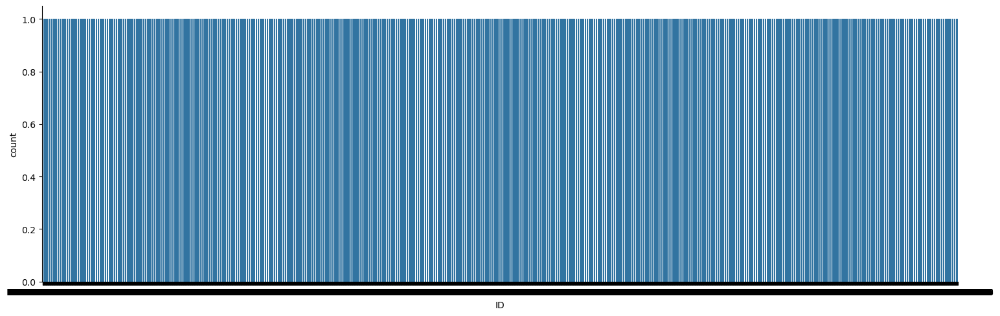

In [95]:
sns.catplot( data = m01_df, x='ID', kind='count', aspect=3 )

plt.show()

ID is unique for the cell phone case. The above plot tells us that each row in the dataset represents one unique cell phone case

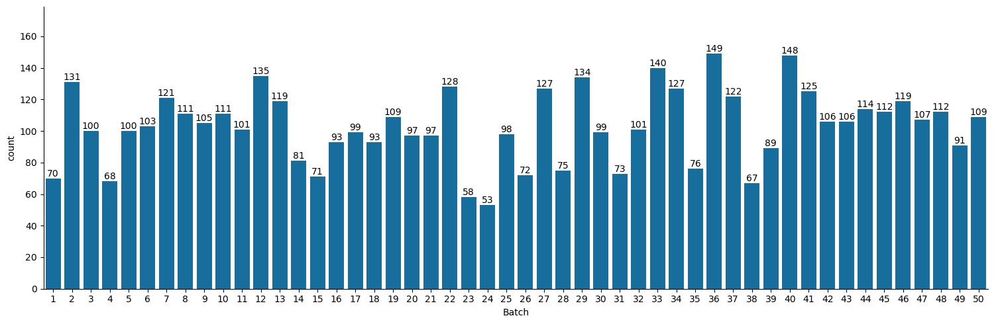

In [125]:
h = sns.catplot(data=m01_df, x='Batch', kind='count', aspect=3)

h.fig.subplots_adjust(top=0.9)

for ax in h.axes.ravel():
    
    # add annotations
    for c in ax.containers:
        labels = [f'{(v.get_height()):.0f}' for v in c]
        ax.bar_label(c, labels=labels, label_type='edge')
    ax.margins(y=0.2)
plt.tight_layout()
plt.show()

Above plot shows number of cell phone cases manufactured per Batch

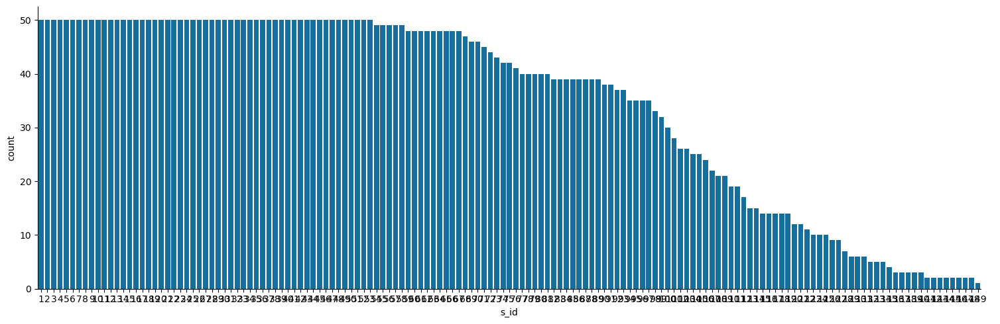

In [126]:
sns.catplot( data = m01_df, x='s_id', kind='count', aspect=3 )

###### MARGINAL behavior of Continuous Variables

First will create a long format representation of the given machine dataset

In [127]:
df_features = m01_df.select_dtypes('number').copy()
df_objects = m01_df.select_dtypes('object').copy()
id_cols = ['rowid'] + df_objects.columns.to_list()
m01_df_lf = m01_df.reset_index().\
rename(columns={'index': 'rowid'}).\
melt(id_vars=id_cols, value_vars=df_features.columns)

In [165]:
m01_df_lf

,rowid,ID,Batch,s_id,variable,value
0,0,B001-M01-S001,1,1,x1,50.117118
1,1,B001-M01-S002,1,2,x1,46.887333
2,2,B001-M01-S003,1,3,x1,50.132744
3,3,B001-M01-S004,1,4,x1,48.501042
4,4,B001-M01-S005,1,5,x1,49.690442
...,...,...,...,...,...,...
20603,5147,B050-M01-S105,50,105,x4,11.456779
20604,5148,B050-M01-S106,50,106,x4,11.048374
20605,5149,B050-M01-S107,50,107,x4,10.697194
20606,5150,B050-M01-S108,50,108,x4,11.052844


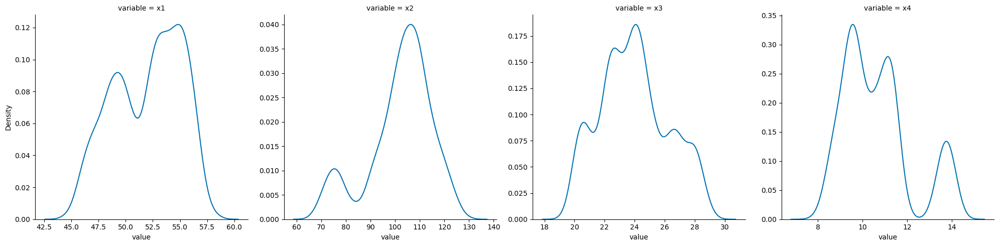

In [129]:
sns.displot(data = m01_df_lf, x='value', col='variable', kind='kde',
            facet_kws={'sharex': False, 'sharey': False},
            common_norm=False)

plt.show()

x1,x3 symmetrical
x2 moderate negative skew
x4 moderate positive skew

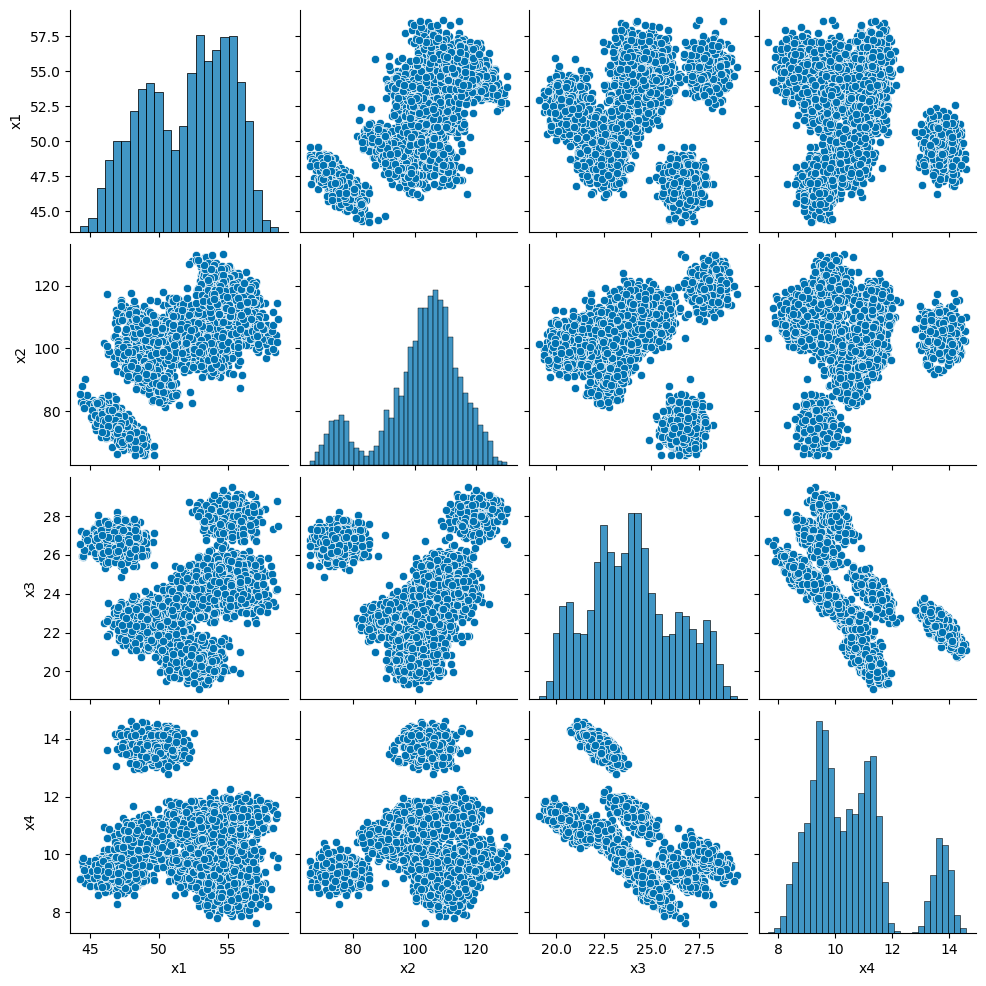

In [149]:
sns.pairplot(data=m01_df[['x1', 'x2', 'x3', 'x4']],  diag_kws={'common_norm': False})

plt.show()

**Do the summary statistics of the OPERATING VARIABLES x1 through x4 vary across the Batch values?**

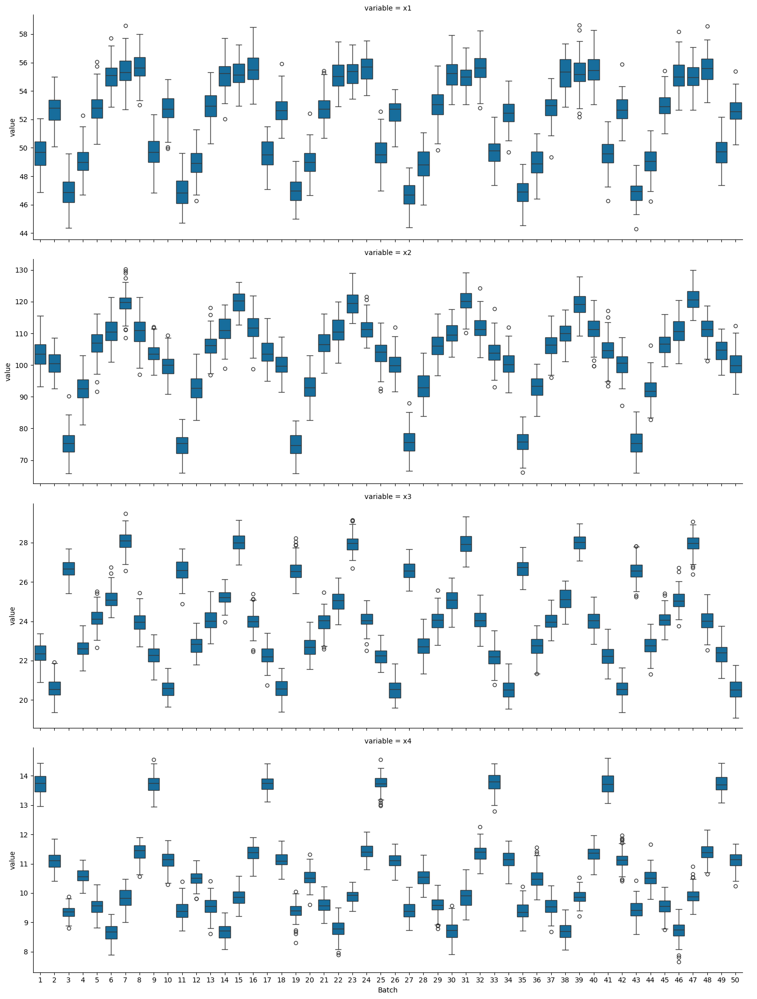

In [154]:
sns.catplot(data = m01_df_lf, x='Batch', y='value', col='variable', col_wrap=1, aspect=3,
            kind='box',
            sharey=False)

plt.show()

Based on the above plot, yes, summary statistics of the OPERATING VARIABLES x1 through x4 vary across the Batch values

##### Machine 2 - `m02_df`

###### **Descriptive Statistics for numerical variables**

In [155]:
m02_df.describe()

,x1,x2,x3,x4,machine_id
count,5119.000000,5119.000000,5119.000000,5119.000000,5119.0
mean,51.989377,101.998905,23.982312,10.605275,2.0
std,3.095129,12.834348,2.275809,1.523140,0.0
min,44.896759,64.774007,19.232164,7.934064,2.0
25%,49.240567,96.325502,22.372944,9.492226,2.0
50%,52.610949,104.357308,23.894465,10.329911,2.0
75%,54.785418,110.672960,25.546656,11.286062,2.0
max,58.503441,131.009046,29.093229,14.400437,2.0


###### Descriptive Statistics for categorical variables

In [156]:
m02_df.describe(include='object')

,ID,Batch,s_id
count,5119,5119,5119
unique,5119,50,133
top,B001-M02-S001,43,1
freq,1,133,50


###### MARGINAL behavior of Categorical Variables

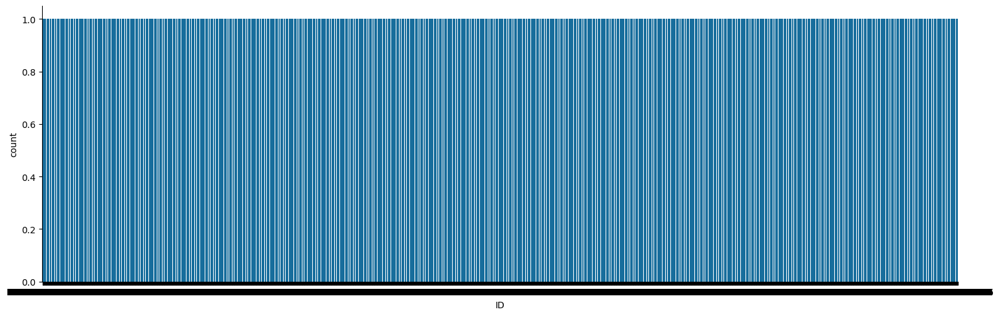

In [157]:
sns.catplot( data = m02_df, x='ID', kind='count', aspect=3 )

plt.show()

ID is unique for the cell phone case. The above plot tells us that each row in the dataset represents one unique cell phone case

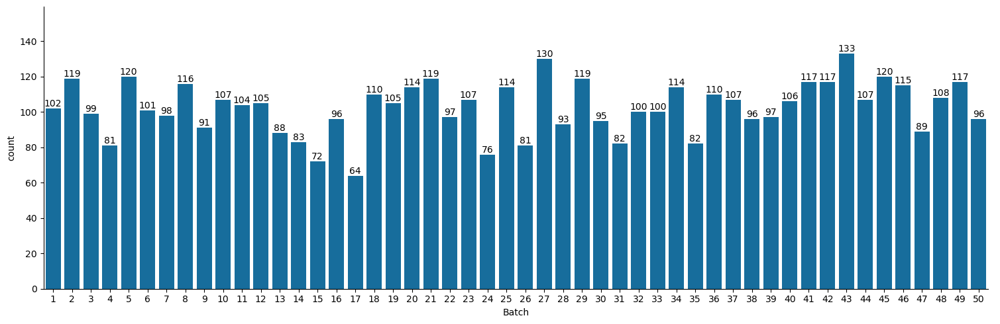

In [160]:
h = sns.catplot(data=m02_df, x='Batch', kind='count', aspect=3)

h.fig.subplots_adjust(top=0.9)

for ax in h.axes.ravel():
    
    # add annotations
    for c in ax.containers:
        labels = [f'{(v.get_height()):.0f}' for v in c]
        ax.bar_label(c, labels=labels, label_type='edge')
    ax.margins(y=0.2)
plt.tight_layout()
plt.show()

Above plot shows number of cell phone cases manufactured per Batch

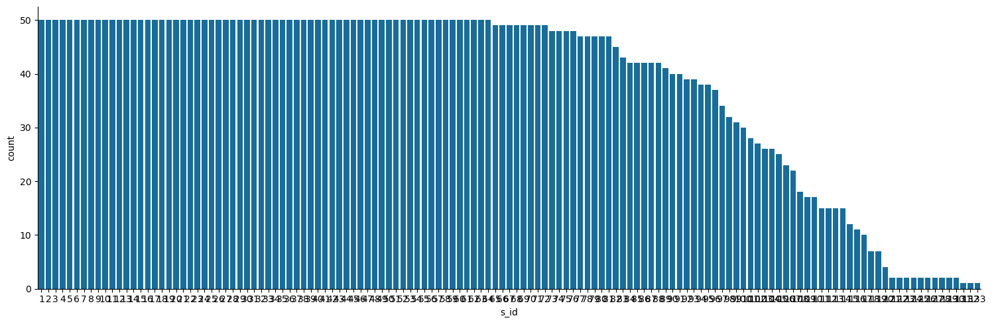

In [161]:
sns.catplot( data = m02_df, x='s_id', kind='count', aspect=3 )

###### MARGINAL behavior of Continuous Variables

First will create a long format representation of the given machine dataset

In [172]:
df_features = m02_df.select_dtypes('number').copy()
df_objects = m02_df.select_dtypes('object').copy()
id_cols = ['rowid'] + df_objects.columns.to_list()
m02_df_lf = m02_df.reset_index().\
rename(columns={'index': 'rowid'}).\
melt(id_vars=id_cols, value_vars=df_features.columns)

In [173]:
m02_df_lf

,rowid,ID,Batch,s_id,variable,value
0,0,B001-M02-S001,1,1,x1,50.213596
1,1,B001-M02-S002,1,2,x1,49.811232
2,2,B001-M02-S003,1,3,x1,48.968142
3,3,B001-M02-S004,1,4,x1,50.477133
4,4,B001-M02-S005,1,5,x1,50.188501
...,...,...,...,...,...,...
20471,5114,B050-M02-S092,50,92,x4,10.963370
20472,5115,B050-M02-S093,50,93,x4,11.156604
20473,5116,B050-M02-S094,50,94,x4,11.303222
20474,5117,B050-M02-S095,50,95,x4,11.084512


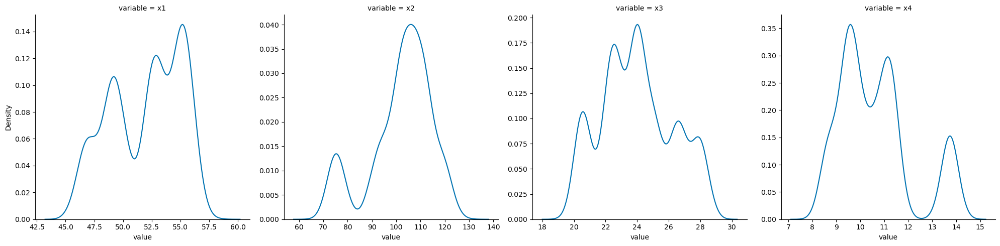

In [174]:
sns.displot(data = m02_df_lf, x='value', col='variable', kind='kde',
            facet_kws={'sharex': False, 'sharey': False},
            common_norm=False)

plt.show()

* x1,x3 symmetrical
* x2 moderate negative skew
* x4 moderate positive skew

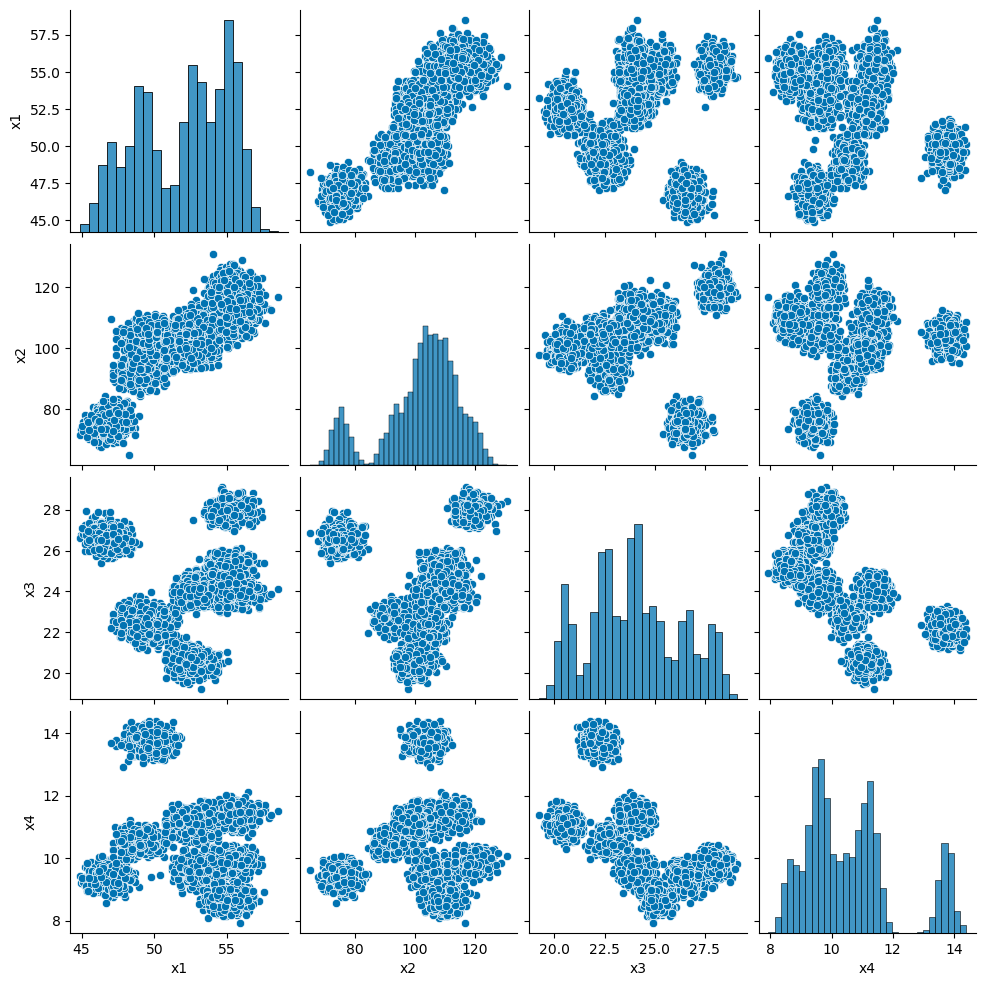

In [184]:
sns.pairplot(data=m02_df[['x1', 'x2', 'x3', 'x4']],  diag_kws={'common_norm': False})

plt.show()

**Do the summary statistics of the OPERATING VARIABLES x1 through x4 vary across the Batch values?**

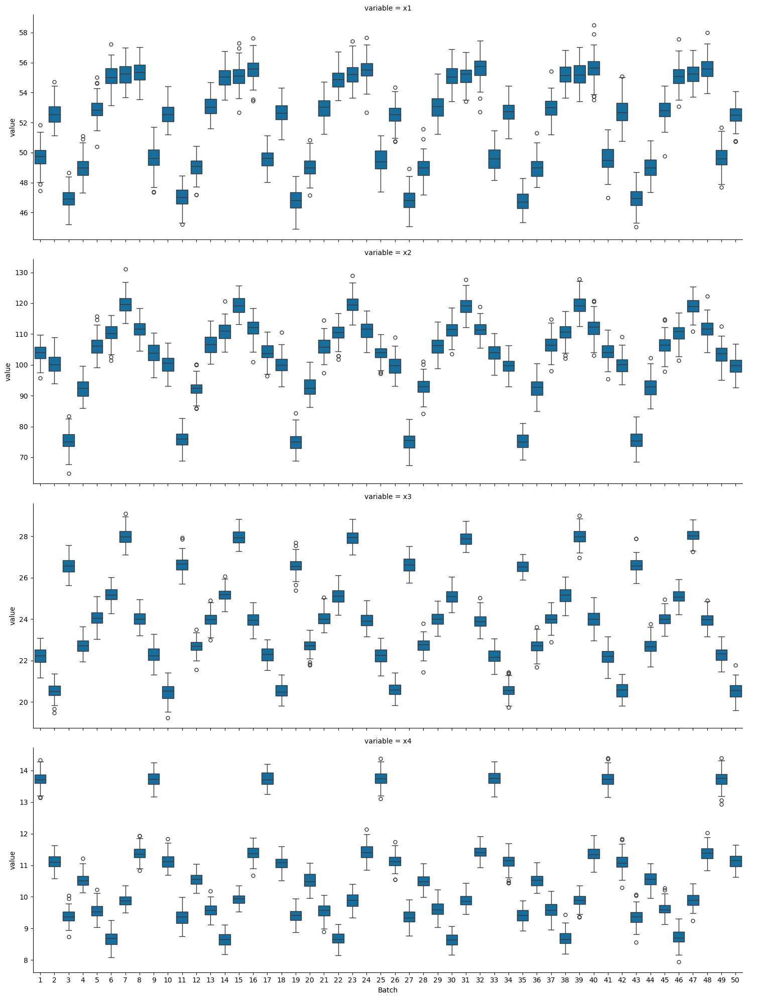

In [185]:
sns.catplot(data = m02_df_lf, x='Batch', y='value', col='variable', col_wrap=1, aspect=3,
            kind='box',
            sharey=False)

plt.show()

Based on the above plot, yes, summary statistics of the OPERATING VARIABLES x1 through x4 vary across the Batch values

##### Machine 3 - `m03_df`

###### **Descriptive Statistics for numerical variables**

In [186]:
m03_df.describe()

,x1,x2,x3,x4
count,4458.000000,4458.000000,4458.000000,4458.000000
mean,51.857672,101.650057,23.927679,10.602371
std,3.022646,12.243012,2.035196,1.554708
min,45.690397,70.192150,19.865338,8.155668
25%,49.228020,95.381831,22.457249,9.475467
50%,52.598712,104.712727,23.900193,10.351781
75%,54.810528,110.050211,25.142293,11.301126
max,56.981029,126.332105,28.972747,14.182623


###### Descriptive Statistics for categorical variables

In [187]:
m03_df.describe(include='object')

,ID,Batch,s_id
count,4458,4458,4458
unique,4458,41,141
top,B001-M03-S001,5,1
freq,1,141,41


###### MARGINAL behavior of Categorical Variables

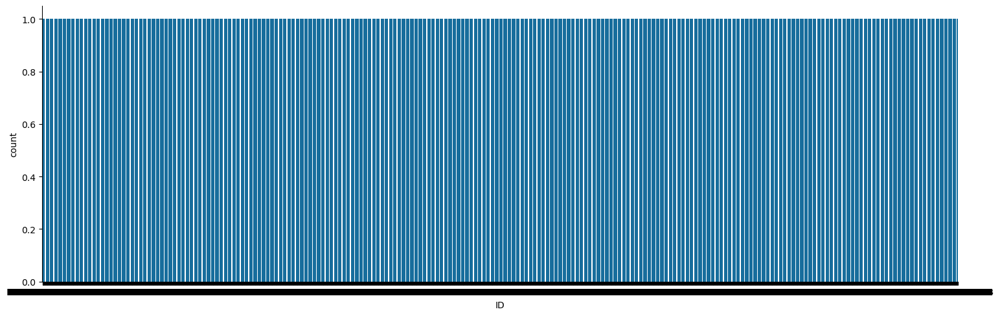

In [188]:
sns.catplot( data = m03_df, x='ID', kind='count', aspect=3 )

plt.show()

ID is unique for the cell phone case. The above plot tells us that each row in the dataset represents one unique cell phone case

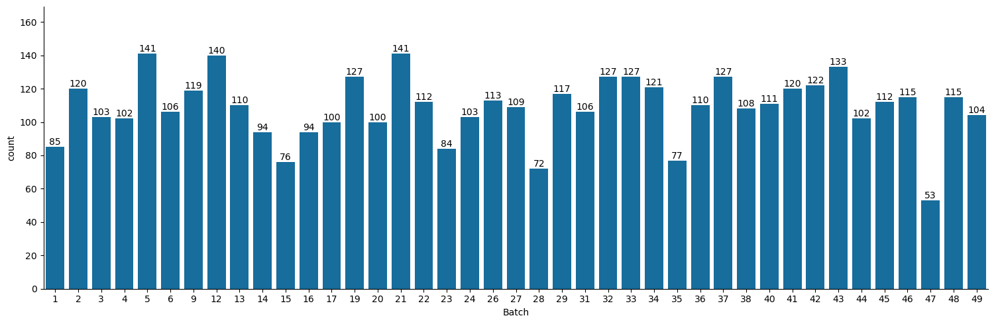

In [189]:
h = sns.catplot(data=m03_df, x='Batch', kind='count', aspect=3)

h.fig.subplots_adjust(top=0.9)

for ax in h.axes.ravel():
    
    # add annotations
    for c in ax.containers:
        labels = [f'{(v.get_height()):.0f}' for v in c]
        ax.bar_label(c, labels=labels, label_type='edge')
    ax.margins(y=0.2)
plt.tight_layout()
plt.show()

Above plot shows number of cell phone cases manufactured per Batch

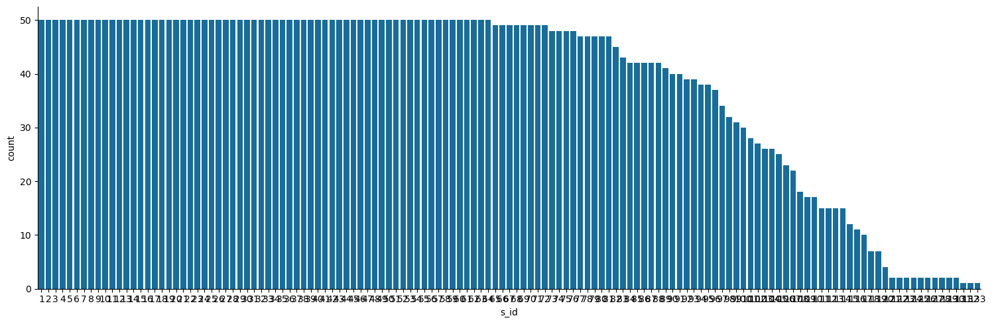

In [161]:
sns.catplot( data = m02_df, x='s_id', kind='count', aspect=3 )

###### MARGINAL behavior of Continuous Variables

First will create a long format representation of the given machine dataset

In [172]:
df_features = m02_df.select_dtypes('number').copy()
df_objects = m02_df.select_dtypes('object').copy()
id_cols = ['rowid'] + df_objects.columns.to_list()
m02_df_lf = m02_df.reset_index().\
rename(columns={'index': 'rowid'}).\
melt(id_vars=id_cols, value_vars=df_features.columns)

In [173]:
m02_df_lf

,rowid,ID,Batch,s_id,variable,value
0,0,B001-M02-S001,1,1,x1,50.213596
1,1,B001-M02-S002,1,2,x1,49.811232
2,2,B001-M02-S003,1,3,x1,48.968142
3,3,B001-M02-S004,1,4,x1,50.477133
4,4,B001-M02-S005,1,5,x1,50.188501
...,...,...,...,...,...,...
20471,5114,B050-M02-S092,50,92,x4,10.963370
20472,5115,B050-M02-S093,50,93,x4,11.156604
20473,5116,B050-M02-S094,50,94,x4,11.303222
20474,5117,B050-M02-S095,50,95,x4,11.084512


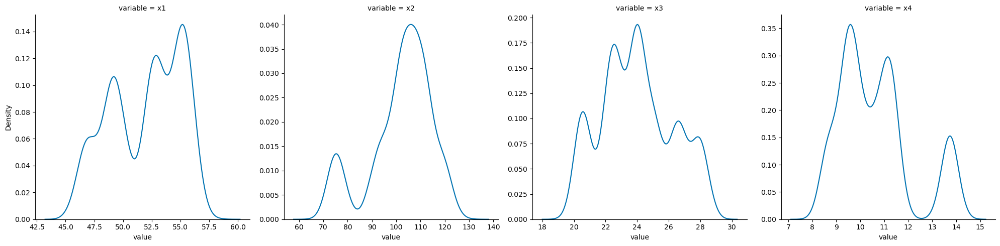

In [174]:
sns.displot(data = m02_df_lf, x='value', col='variable', kind='kde',
            facet_kws={'sharex': False, 'sharey': False},
            common_norm=False)

plt.show()

* x1,x3 symmetrical
* x2 moderate negative skew
* x4 moderate positive skew

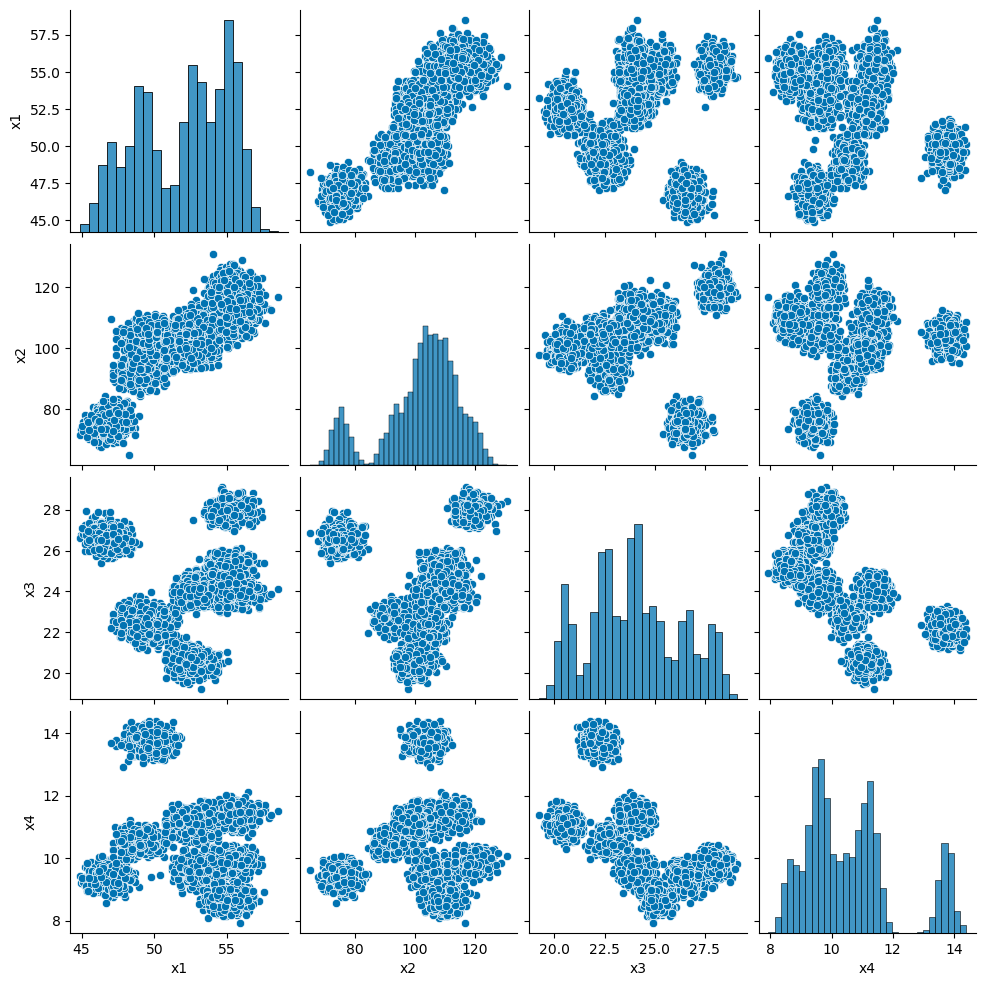

In [184]:
sns.pairplot(data=m02_df[['x1', 'x2', 'x3', 'x4']],  diag_kws={'common_norm': False})

plt.show()

**Do the summary statistics of the OPERATING VARIABLES x1 through x4 vary across the Batch values?**

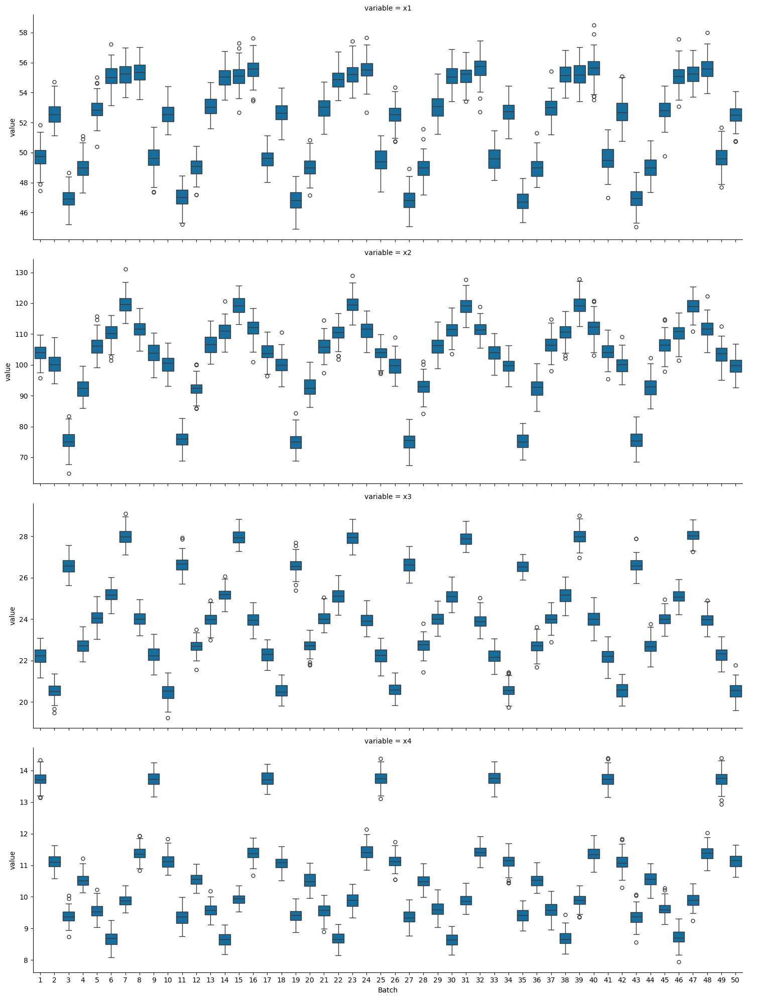

In [185]:
sns.catplot(data = m02_df_lf, x='Batch', y='value', col='variable', col_wrap=1, aspect=3,
            kind='box',
            sharey=False)

plt.show()

Based on the above plot, yes, summary statistics of the OPERATING VARIABLES x1 through x4 vary across the Batch values

###### Relationships

In [196]:
m01_df['machine_id'] = 1
m02_df['machine_id'] = 2
m03_df['machine_id'] = 3
machine_df = pd.concat([m01_df, m02_df, m03_df])


machine_df['Batch']=machine_df.Batch.astype('object')
machine_df['s_id']=machine_df.s_id.astype('object')
machine_df['ID']=machine_df.ID.astype('object')
machine_df['machine_id']=machine_df.machine_id.astype('object')

machine_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14729 entries, 0 to 4457
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   ID          14729 non-null  object 
 1   Batch       14729 non-null  object 
 2   s_id        14729 non-null  object 
 3   x1          14729 non-null  float64
 4   x2          14729 non-null  float64
 5   x3          14729 non-null  float64
 6   x4          14729 non-null  float64
 7   machine_id  14729 non-null  object 
dtypes: float64(4), object(4)
memory usage: 1.0+ MB


In [197]:
df_features = machine_df.select_dtypes('number').copy()
df_objects = machine_df.select_dtypes('object').copy()
id_cols = ['rowid'] + df_objects.columns.to_list()
machine_df_lf = machine_df.reset_index().\
rename(columns={'index': 'rowid'}).\
melt(id_vars=id_cols, value_vars=df_features.columns)

machine_df_lf. head()

,rowid,ID,Batch,s_id,machine_id,variable,value
0,0,B001-M01-S001,1,1,1,x1,50.117118
1,1,B001-M01-S002,1,2,1,x1,46.887333
2,2,B001-M01-S003,1,3,1,x1,50.132744
3,3,B001-M01-S004,1,4,1,x1,48.501042
4,4,B001-M01-S005,1,5,1,x1,49.690442


**How many unique values for `Batch` are associated with each MACHINE (data set)?**

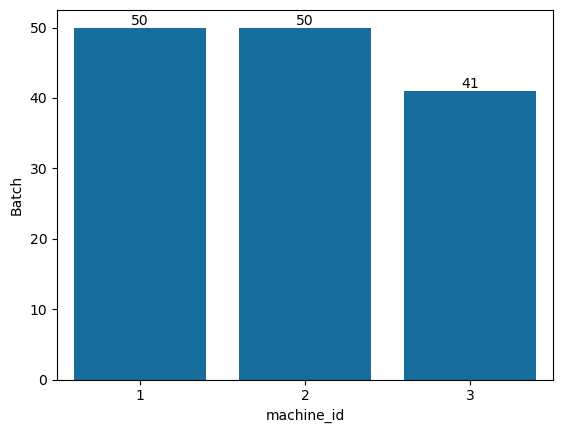

In [198]:
fig, ax = plt.subplots()
ax = sns.barplot(machine_df.groupby('machine_id').Batch.nunique())
ax.bar_label(ax.containers[0], fontsize=10);

There are 50 unique values for `Batch` in machine 1, machine 2 and 41 in the machine 3

**How many cell phone cases are associated with each `Batch` value for each MACHINE (data set)?**

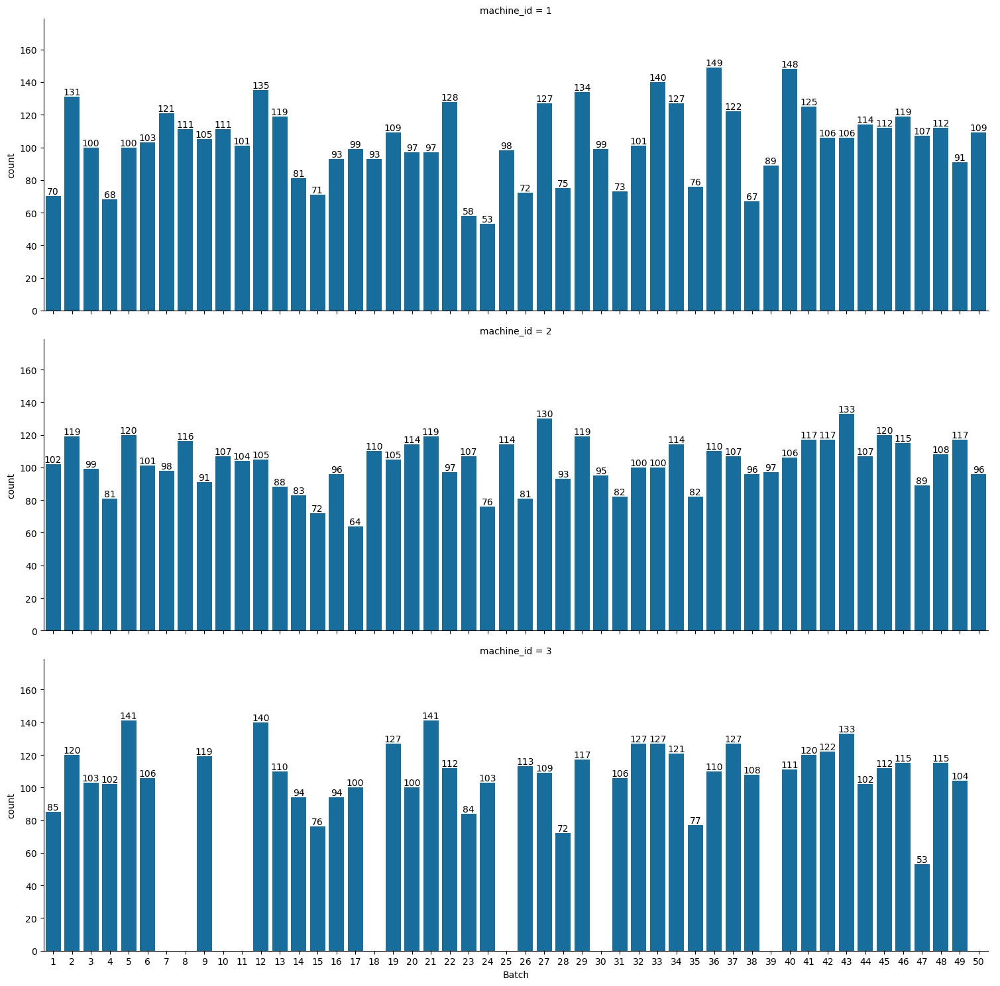

In [144]:
g = sns.catplot(data=machine_df, x='Batch', kind='count', col='machine_id', col_wrap=1, aspect=3,)

g.fig.subplots_adjust(top=0.9)

# iterate through axes
for ax in g.axes.ravel():
    
    # add annotations
    for c in ax.containers:
        labels = [f'{(v.get_height()):.0f}' for v in c]
        ax.bar_label(c, labels=labels, label_type='edge')
    ax.margins(y=0.2)
plt.tight_layout()
plt.show()

**Do the summary statistics of the OPERATING VARIABLES `x1` through `x4` vary across the three MACHINES?**

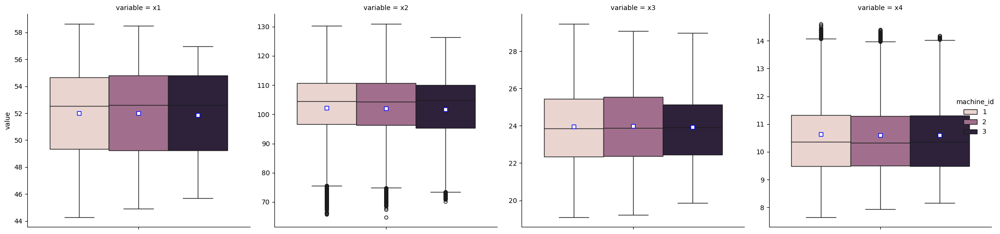

In [226]:
sns.catplot(data = machine_df_lf,  hue='machine_id', col='variable', y='value',
            kind='box', 
            sharey=False, showmeans=True,
            meanprops={"marker":"s","markerfacecolor":"white", "markeredgecolor":"blue"}
           )
# plt.subplots_adjust(hspace=0.5)
plt.tight_layout()
plt.show()

The summary statistics of the OPERATING VARIABLES `x1` through `x4` vary among themselves but **does not vary across the machines**

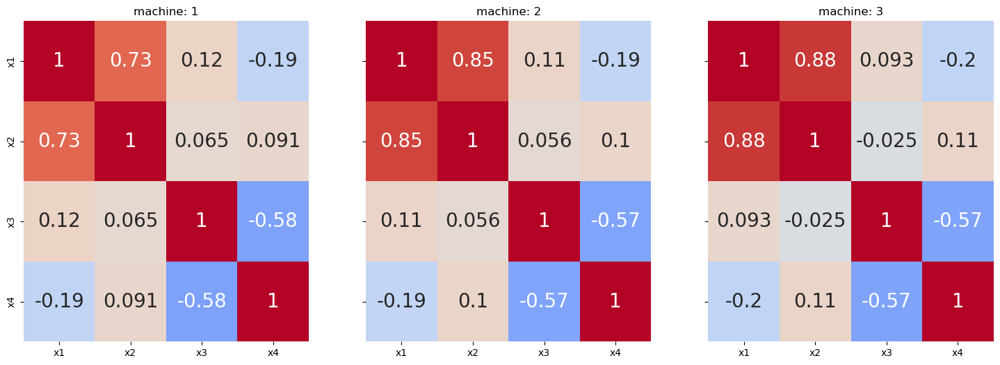

In [229]:
the_groups = machine_df.machine_id.unique().tolist()

corr_per_group = machine_df.loc[ :, ['machine_id', 'x1', 'x2', 'x3', 'x4']].groupby(['machine_id']).corr()

fig, axs = plt.subplots(1, len(the_groups), figsize=(18, 6), sharex=True, sharey=True )

for ix in range(len(the_groups)):
    sns.heatmap( data = corr_per_group.loc[ the_groups[ ix ] ],
                 vmin=-1, vmax=1, center = 0,
                 cmap='coolwarm', cbar=False,
                 annot=True, annot_kws={'size': 20},
                 ax=axs[ix] )
    
    axs[ ix ].set_title('machine: %s' % the_groups[ ix ] )

plt.show()

1. `x1` and `x2` have **strong positive correlation across all three machines**
2. `x3` and `x4` have **moderate negative correlation across all three machine**

**Do the summary statistics of the OPERATING VARIABLES `x1` through `x4` vary across the `Batch` values?**

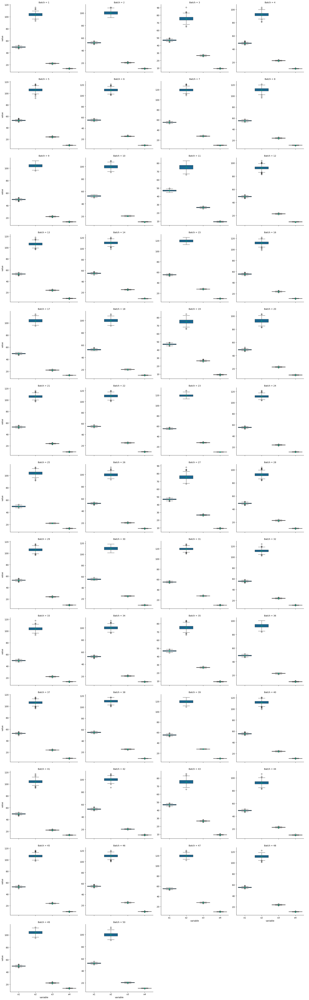

In [217]:
sns.catplot(data = machine_df_lf, x='variable',y='value', col='Batch', col_wrap=4,
            # hue='machine_id',
            kind='box',
            showmeans=True,
            sharey=False)

plt.show()

The summary statistics of the OPERATING VARIABLES `x1` through `x4` among themselves but looks similar across Batches

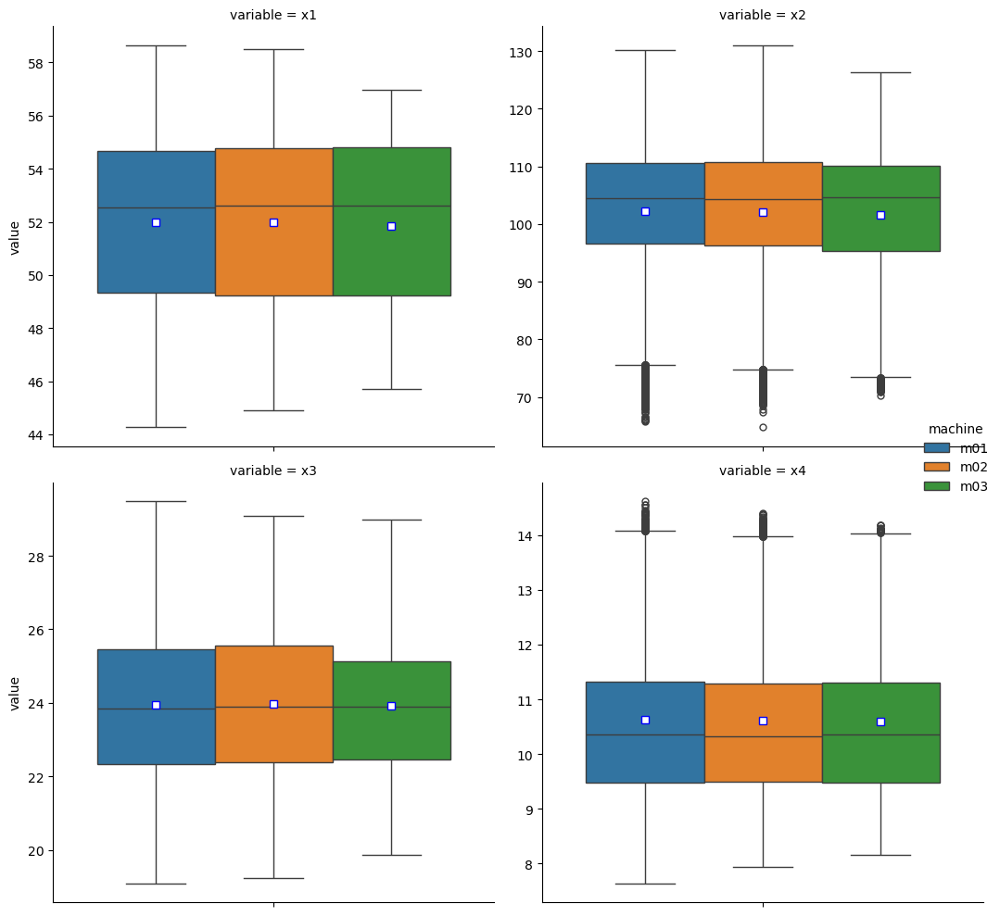

In [188]:
sns.catplot(data = df_lf[['machine', 'value', 'variable']],  hue='machine', y='value', col='variable', 
            kind='box',
            sharey=False,
            showmeans=True,
            meanprops={"marker":"s","markerfacecolor":"white", "markeredgecolor":"blue"},
            col_wrap=2)
# plt.subplots_adjust(hspace=0.5)
plt.tight_layout()
plt.show()

Do the summary statistics of the OPERATING VARIABLES x1 through x4 vary across the three MACHINES?

Yes, the summary statistics of the OPERATING VARIABLES x1 through x4 vary across the three MACHINES. Below are the details

1. The MIN and MAX of variable is x1 differs across three machine while the mean is fairly consistent
2. The x2 variable has more outliers in machine1 followed by machine2 and machine3

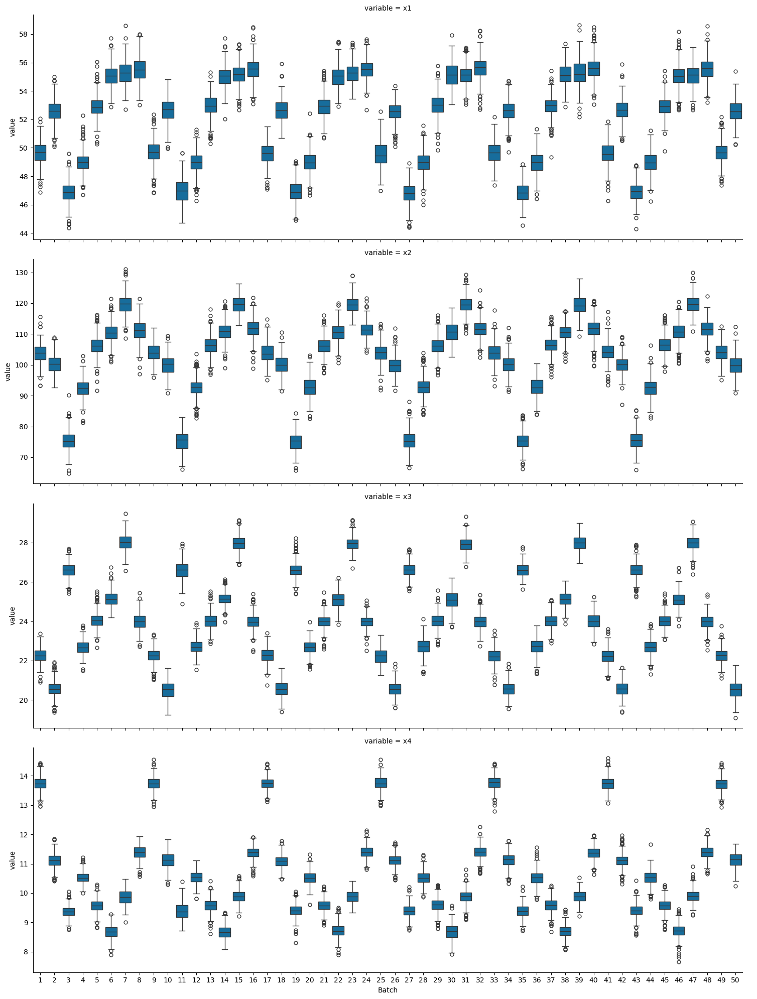

In [216]:
sns.catplot(data = machine_df_lf, x='Batch', y='value', col='variable', col_wrap=1, aspect=3,
            # hue='machine',
            kind='box',
            sharey=False)

plt.show()

Yes, the summary statistics of the OPERATING VARIABLES x1 through x4 vary across the Batch values. But the summary statistics also tends to follow a repetitive pattern.

## Relationships

In [227]:
machine_df['Batch'] = machine_df.Batch.astype('category')

Relationships in machine m01


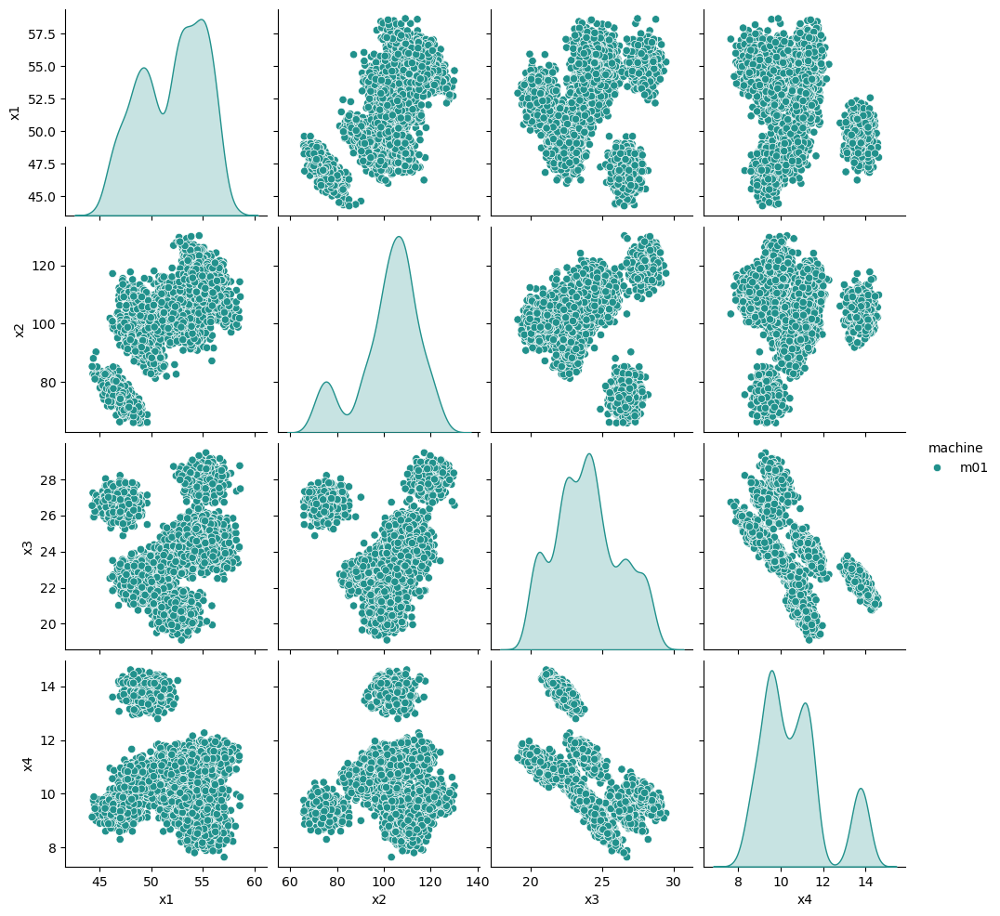

--------------------------------------
Relationships in machine m02


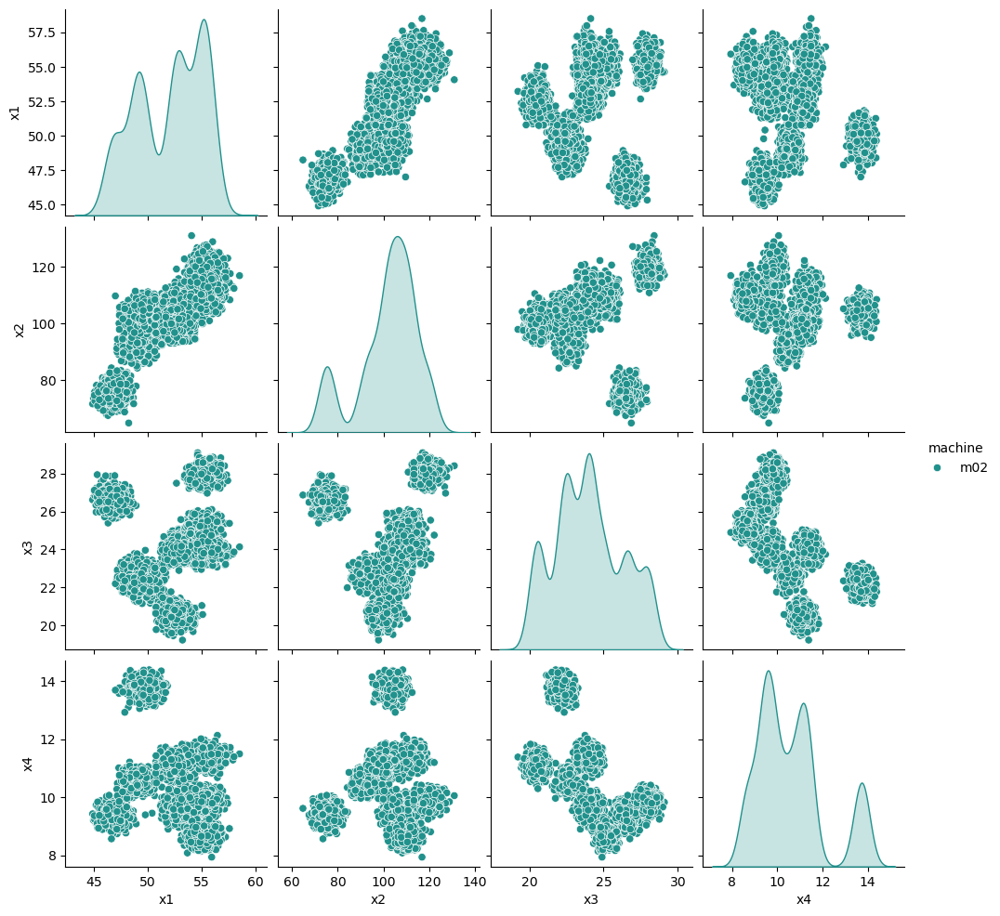

--------------------------------------
Relationships in machine m03


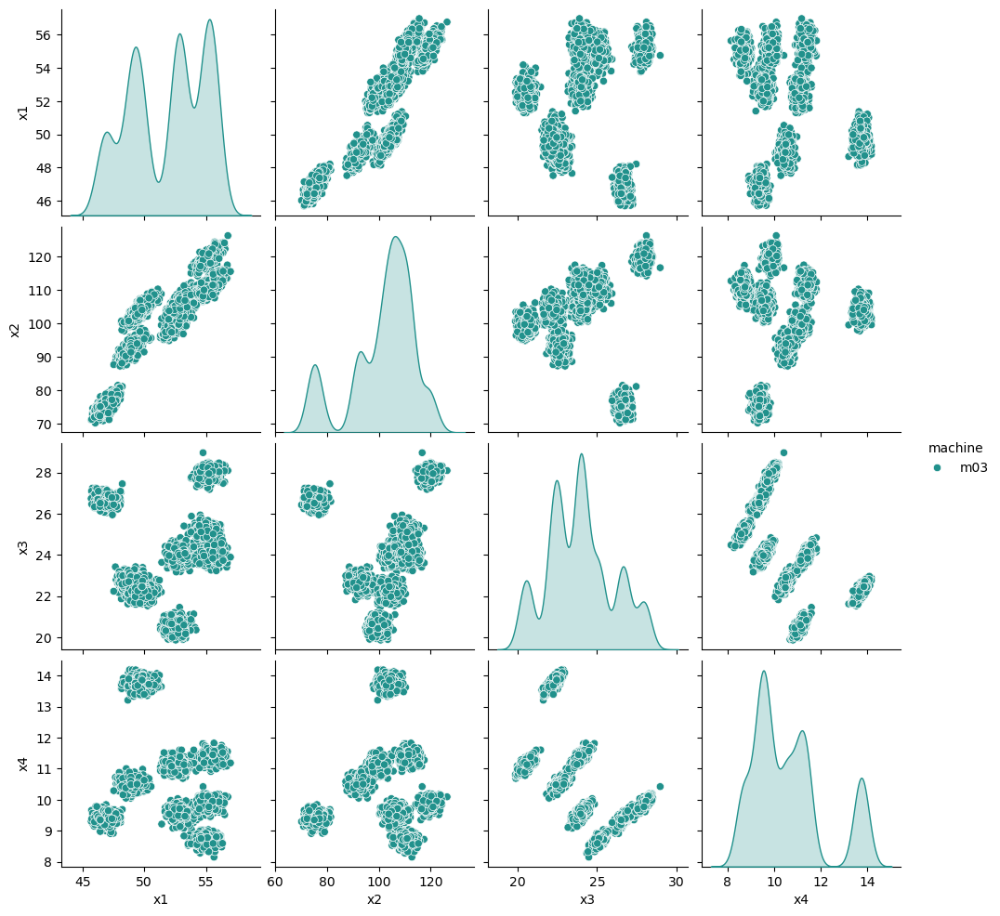

--------------------------------------


In [228]:
machines = machine_df['machine'].unique()

for _machine in machines:
    print(f"Relationships in machine {_machine}")
    sns.pairplot(data=machine_df.loc[machine_df['machine']==_machine, ['machine', 'x1', 'x2', 'x3', 'x4']],
                 hue='machine',
                 diag_kws={'common_norm': False},
                 palette='viridis')
    plt.show()
    print(f"--------------------------------------")

Relationships in machine m01


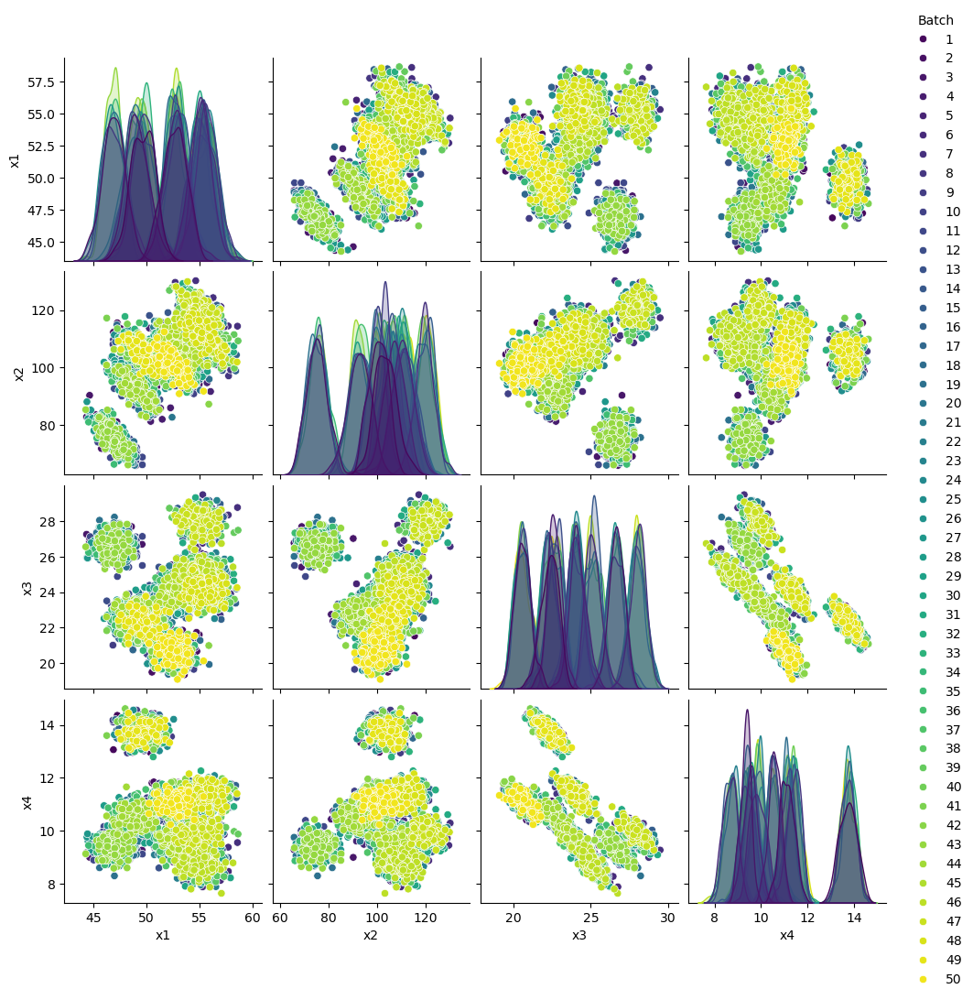

--------------------------------------
Relationships in machine m02


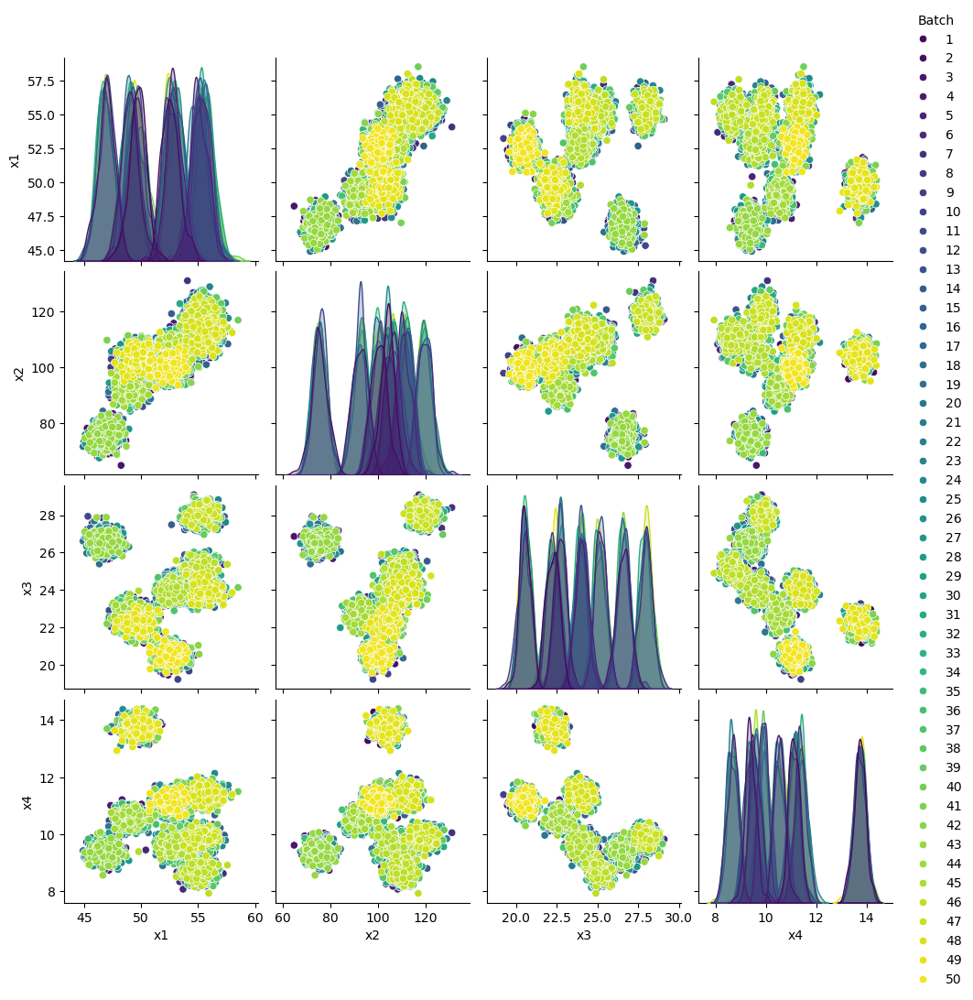

--------------------------------------
Relationships in machine m03


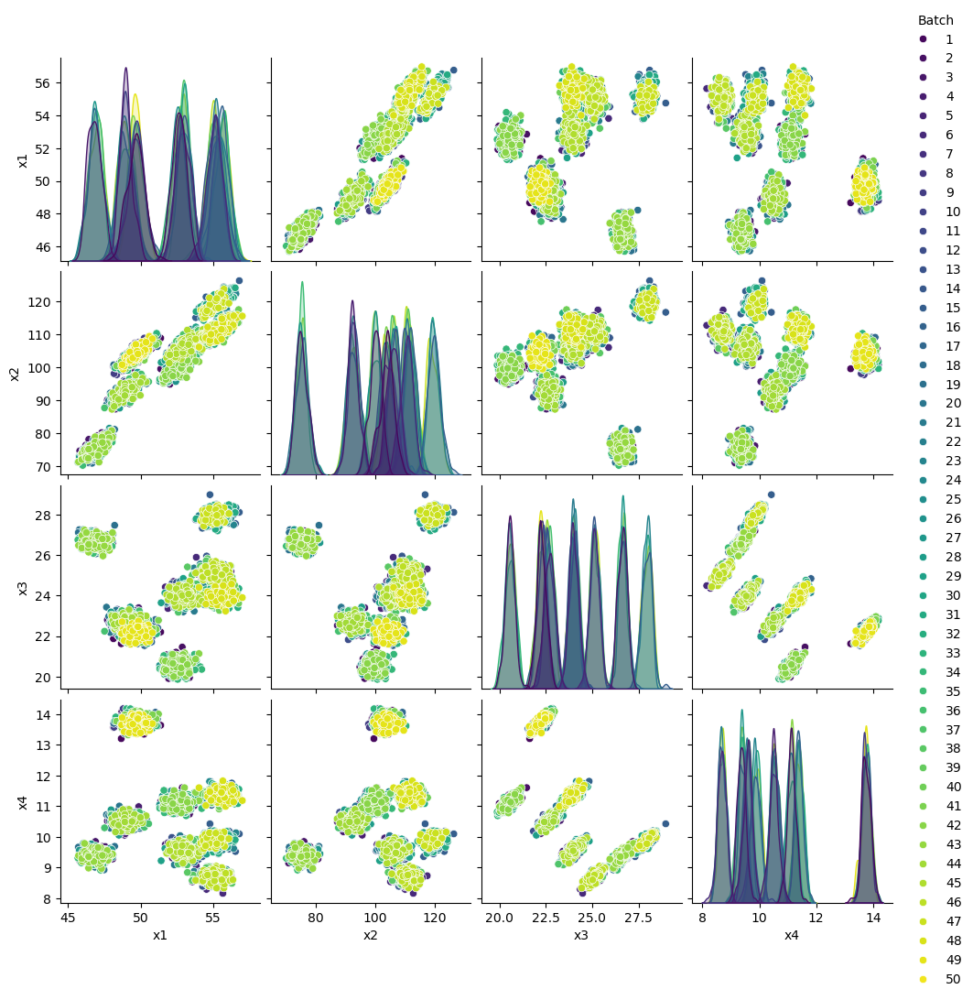

--------------------------------------


In [226]:
machines = machine_df['machine'].unique()

for _machine in machines:
    print(f"Relationships in machine {_machine}")
    sns.pairplot(data=machine_df.loc[machine_df['machine']==_machine, ['Batch', 'x1', 'x2', 'x3', 'x4']],
                 hue='Batch',
                 diag_kws={'common_norm': False},
                 palette='viridis')
    plt.show()
    print(f"--------------------------------------")

In [222]:
machine_df.groupby('machine').Batch.value_counts()

machine  Batch
m01      36       149
         40       148
         33       140
         12       135
         29       134
                 ... 
m03      18         0
         25         0
         30         0
         39         0
         50         0
Name: count, Length: 150, dtype: int64

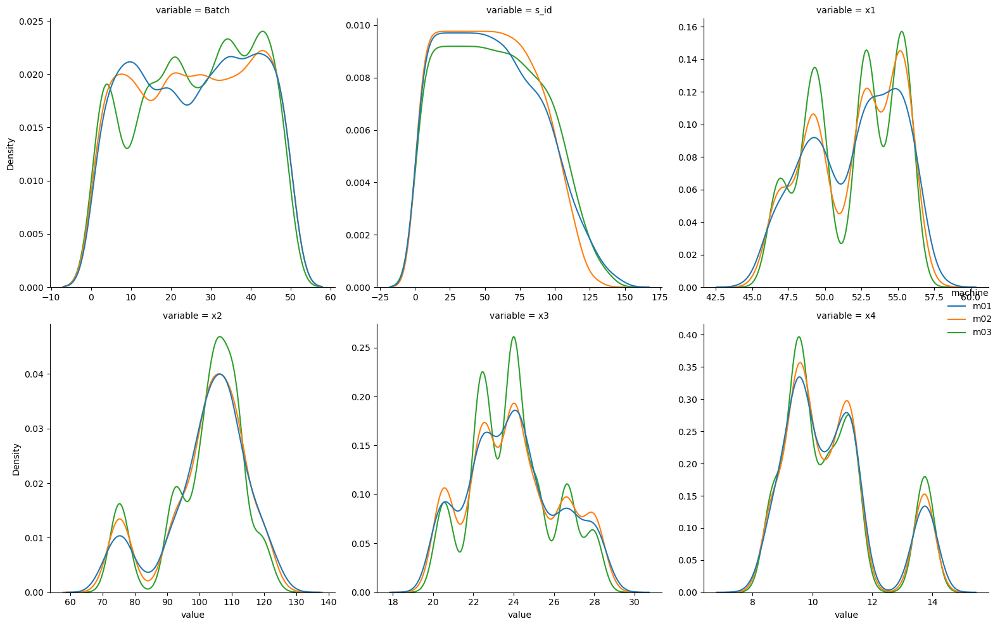

In [49]:
sns.displot(data = df_lf,  
            hue='machine', 
            x='value', col='variable', 
            kind='kde',
            facet_kws={'sharex': False, 'sharey': False},
            common_norm=False,
            col_wrap=3)
plt.subplots_adjust(hspace=0.5)
plt.tight_layout()
plt.tight_layout()
plt.show()

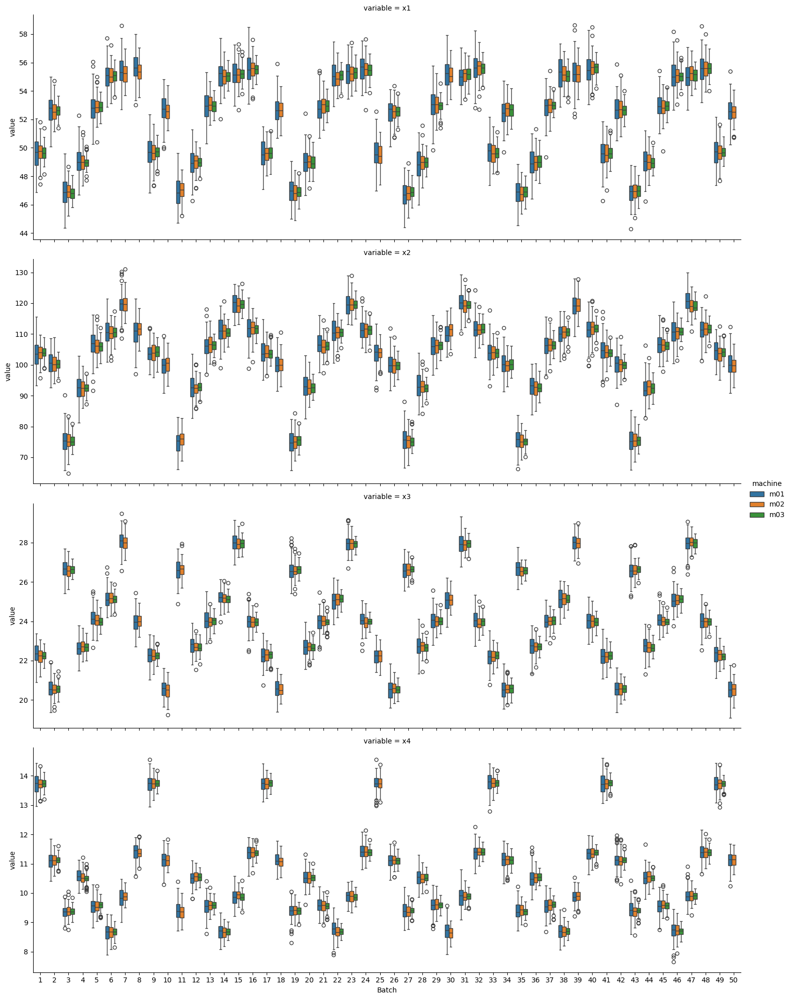

In [209]:
sns.catplot(data = df_lf, x='Batch', y='value', col='variable', col_wrap=1, aspect=3,
            kind='box',
            hue='machine',
            sharey=False)

plt.show()

In [63]:
machine_df.groupby('machine')['x1'].describe()

,count,mean,std,min,25%,50%,75%,max
machine,,,,,,,,
m01,5152.0,51.998218,3.151912,44.275379,49.335776,52.536206,54.662490,58.647186
m02,5119.0,51.989377,3.095129,44.896759,49.240567,52.610949,54.785418,58.503441
m03,4458.0,51.857672,3.022646,45.690397,49.228020,52.598712,54.810528,56.981029


In [80]:
m01_df.describe()

,Batch,s_id,x1,x2,x3,x4
count,5152.000000,5152.000000,5152.000000,5152.000000,5152.000000,5152.000000
mean,26.047748,54.540373,51.998218,102.207011,23.947216,10.628436
std,14.560368,33.650665,3.151912,12.888171,2.269325,1.542291
min,1.000000,1.000000,44.275379,65.810729,19.095832,7.644190
25%,13.000000,26.000000,49.335776,96.610288,22.334048,9.479969
50%,27.000000,52.000000,52.536206,104.487824,23.855690,10.356002
75%,39.000000,80.000000,54.662490,110.609442,25.448356,11.318120
max,50.000000,149.000000,58.647186,130.228828,29.477213,14.612911


In [81]:
m02_df.describe()

,Batch,s_id,x1,x2,x3,x4
count,5119.000000,5119.000000,5119.000000,5119.000000,5119.000000,5119.000000
mean,25.929674,52.754444,51.989377,101.998905,23.982312,10.605275
std,14.595274,31.263876,3.095129,12.834348,2.275809,1.523140
min,1.000000,1.000000,44.896759,64.774007,19.232164,7.934064
25%,13.000000,26.000000,49.240567,96.325502,22.372944,9.492226
50%,26.000000,52.000000,52.610949,104.357308,23.894465,10.329911
75%,39.000000,78.000000,54.785418,110.672960,25.546656,11.286062
max,50.000000,133.000000,58.503441,131.009046,29.093229,14.400437


In [82]:
m03_df.describe()

,Batch,s_id,x1,x2,x3,x4
count,4458.00000,4458.000000,4458.000000,4458.000000,4458.000000,4458.000000
mean,26.24428,56.475774,51.857672,101.650057,23.927679,10.602371
std,14.28990,33.827427,3.022646,12.243012,2.035196,1.554708
min,1.00000,1.000000,45.690397,70.192150,19.865338,8.155668
25%,14.00000,28.000000,49.228020,95.381831,22.457249,9.475467
50%,27.00000,55.000000,52.598712,104.712727,23.900193,10.351781
75%,38.00000,83.000000,54.810528,110.050211,25.142293,11.301126
max,49.00000,141.000000,56.981029,126.332105,28.972747,14.182623


In [64]:
machine_df.groupby('machine')['x2'].describe()

,count,mean,std,min,25%,50%,75%,max
machine,,,,,,,,
m01,5152.0,102.207011,12.888171,65.810729,96.610288,104.487824,110.609442,130.228828
m02,5119.0,101.998905,12.834348,64.774007,96.325502,104.357308,110.672960,131.009046
m03,4458.0,101.650057,12.243012,70.192150,95.381831,104.712727,110.050211,126.332105


In [65]:
machine_df.groupby('machine')['x3'].describe()

,count,mean,std,min,25%,50%,75%,max
machine,,,,,,,,
m01,5152.0,23.947216,2.269325,19.095832,22.334048,23.855690,25.448356,29.477213
m02,5119.0,23.982312,2.275809,19.232164,22.372944,23.894465,25.546656,29.093229
m03,4458.0,23.927679,2.035196,19.865338,22.457249,23.900193,25.142293,28.972747


In [66]:
machine_df.groupby('machine')['x4'].describe()

,count,mean,std,min,25%,50%,75%,max
machine,,,,,,,,
m01,5152.0,10.628436,1.542291,7.644190,9.479969,10.356002,11.318120,14.612911
m02,5119.0,10.605275,1.523140,7.934064,9.492226,10.329911,11.286062,14.400437
m03,4458.0,10.602371,1.554708,8.155668,9.475467,10.351781,11.301126,14.182623


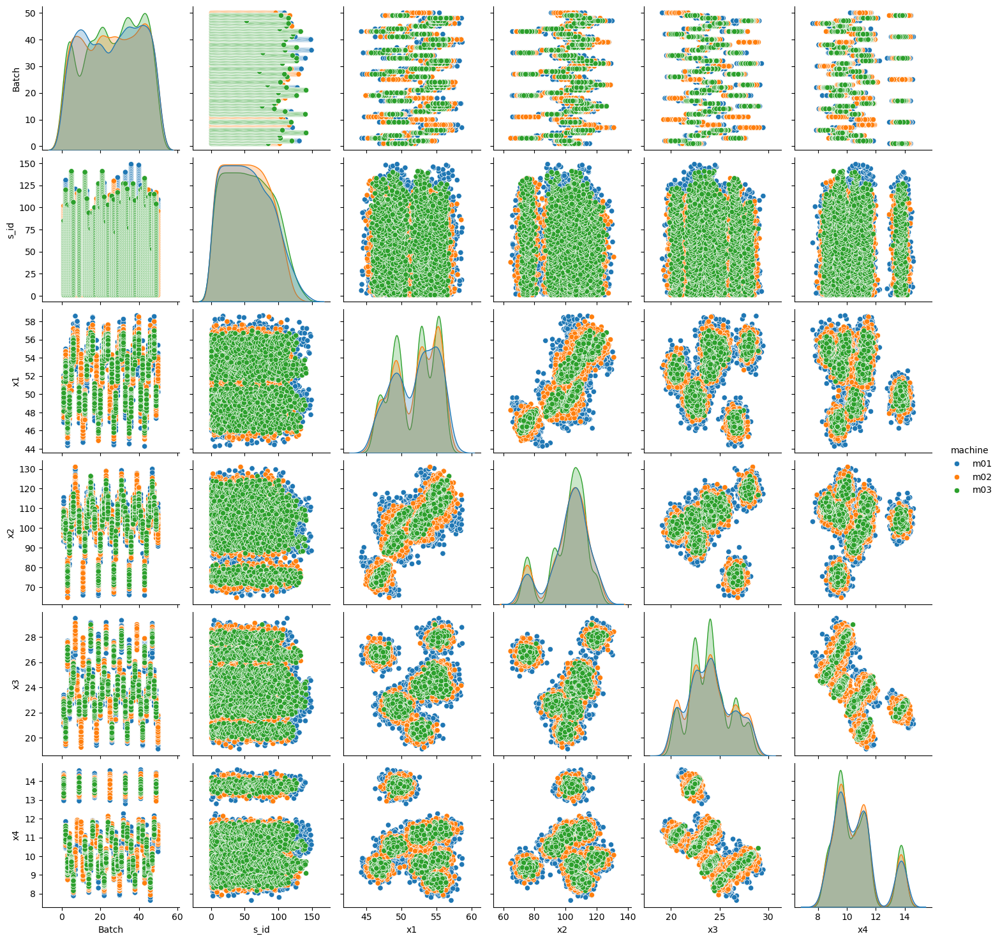

In [79]:
sns.pairplot(data=machine_df,
             hue='machine',
             diag_kws={'common_norm': False})

plt.show()

In [13]:
df_lf.Batch.nunique()

50

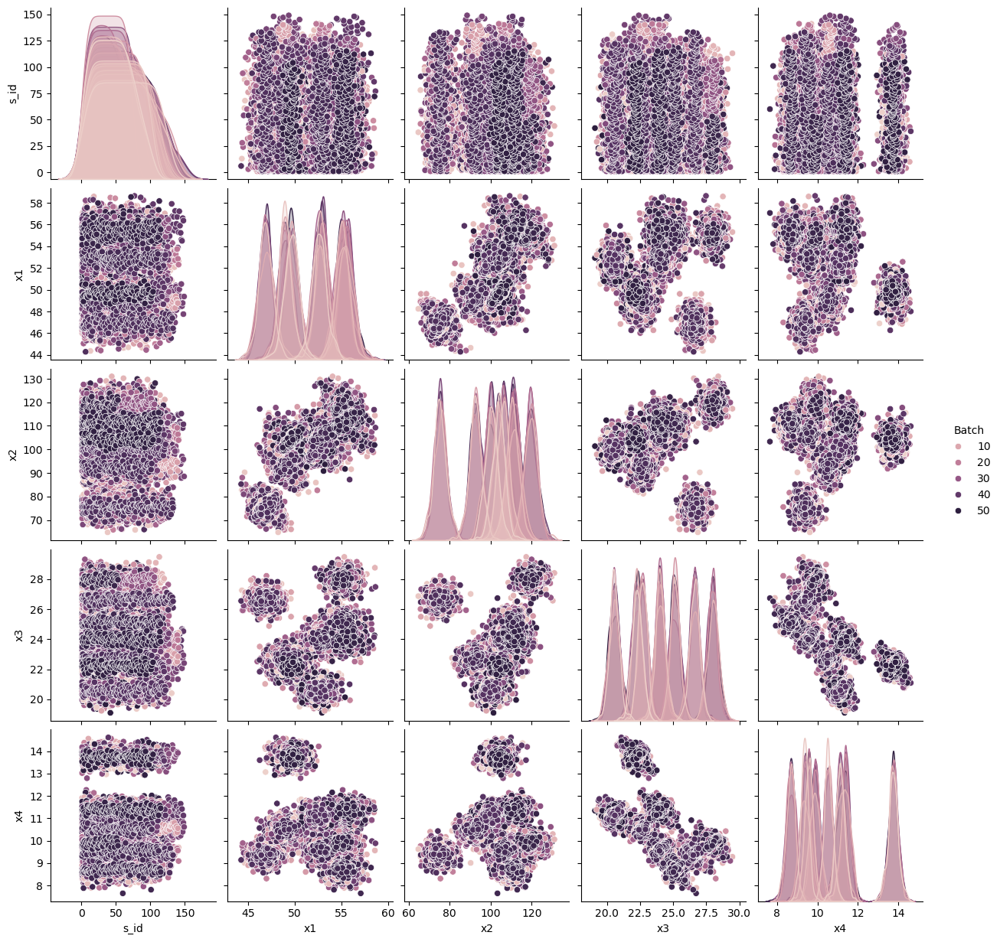

In [85]:
sns.pairplot(data=machine_df,
             hue='Batch',
             diag_kws={'common_norm': False})

plt.show()

In [12]:
# concatenate the 3 DataFrames into a single DataFrame which includes the `machine_id` variable

machine_df = pd.concat([m01_df, m02_df, m03_df])
machine_df.head()

,ID,Batch,s_id,x1,x2,x3,x4
0,B001-M01-S001,1,1,50.117118,102.167346,22.067812,13.889524
1,B001-M01-S002,1,2,46.887333,112.266102,23.197330,13.064709
2,B001-M01-S003,1,3,50.132744,103.674908,22.319933,13.647482
3,B001-M01-S004,1,4,48.501042,107.143156,22.162947,14.077758
4,B001-M01-S005,1,5,49.690442,102.120283,22.248696,13.728666


## Problem 02

The supplier batch data set file name is provided for you below. You must read in the CSV file and assign the data set to the `batch_df` object. 

You must perform the following **ESSENTIAL** activities:

* How many rows and columns are in the data? 
* What are the names and data types for each column?
* How many unique values are there for each column?
* How many missing values are there for each column?

You must visually explore the MARGINAL behavior of the variables in the data. You must use visualizations appropriate for the DATA TYPE of the columns.

You must visually explore RELATIONSHIPS between variables in the data. You must use visualizations appropriate for the DATA TYPES. You must make sure that your visualizations can answer the following questions:
* Do the summary statistics for `Density` depend on the `Supplier`?
* Does the average `Density` depend on the `Supplier`?
* How does `Density` relate to `Batch` for each `Supplier`?

After exploring the `batch_df` DataFrame, you **MUST** JOIN/MERGE the `batch_df` DataFrame with the `machine_df` DataFrame. Assign the merged DataFrame to the `dfa` DataFrame.

You can now explore the relationships between the MACHINE OPERATIONAL VARIABLES and the SUPPLIERS! You must use visualizations to explore the following relationships:
* Explore if the summary statistics of the 4 OPERATING VARIABLES `x1` through `x4` vary across `Batch` for each MACHINE given each `Supplier`. Your figures MUST use `Batch` as the x-axis variable.
* Explore if the relationships between the 4 OPERATING VARIABLES `x1` through `x4` vary across `Supplier`.

You may add as many markdown and code cells as you see fit to answer this question.

#### SOLUTION

In [231]:
# define the batch supplier file
batch_file = 'midterm_supplier.csv'

In [232]:
# read in the batch supplier data set

batch_df = pd.read_csv(batch_file)
batch_df.shape

(50, 3)

There are 50 rows and 3 columns

In [233]:
batch_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50 entries, 0 to 49
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Batch     50 non-null     int64  
 1   Supplier  50 non-null     object 
 2   Density   50 non-null     float64
dtypes: float64(1), int64(1), object(1)
memory usage: 1.3+ KB


There are three columns

1. `Batch` is a number but as given in the problem statement will convert that to a categorical
2. `Supplier` is a categorical
3. `Density` is a number

In [234]:
batch_df['Batch'] = batch_df['Batch'].astype('object')
batch_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50 entries, 0 to 49
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Batch     50 non-null     object 
 1   Supplier  50 non-null     object 
 2   Density   50 non-null     float64
dtypes: float64(1), object(2)
memory usage: 1.3+ KB


In [235]:
batch_df.nunique(dropna=False)

Batch       50
Supplier     2
Density     50
dtype: int64

There are 50 unique values for `Batch` and `Density` and 2 unique values for `Supplier`

In [236]:
batch_df.isna().sum()

Batch       0
Supplier    0
Density     0
dtype: int64

There are no missing values

### Marginal Behavior

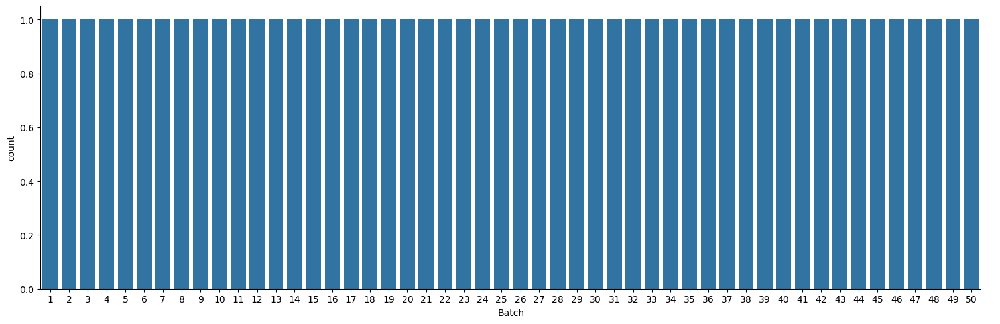

In [237]:
sns.catplot( data = batch_df, x='Batch', kind='count', aspect=3 )
plt.show()

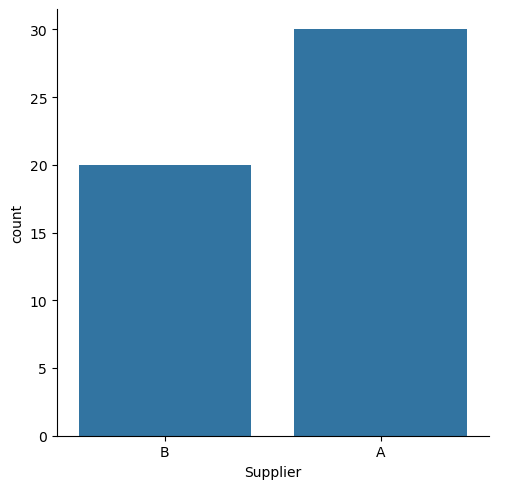

In [238]:
sns.catplot( data = batch_df, x='Supplier', kind='count' )

plt.show()

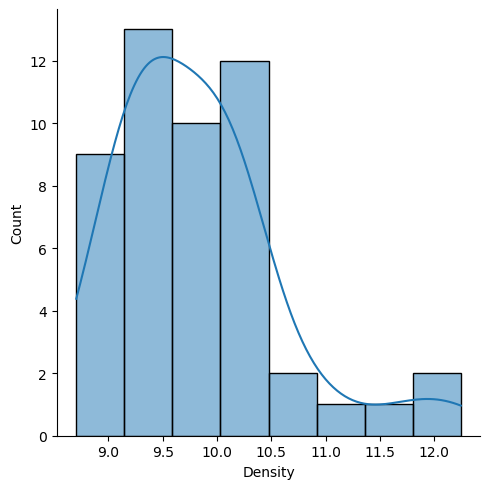

In [239]:
sns.displot(data = batch_df, x='Density', kind='hist', kde=True)

plt.show()

### Relationships

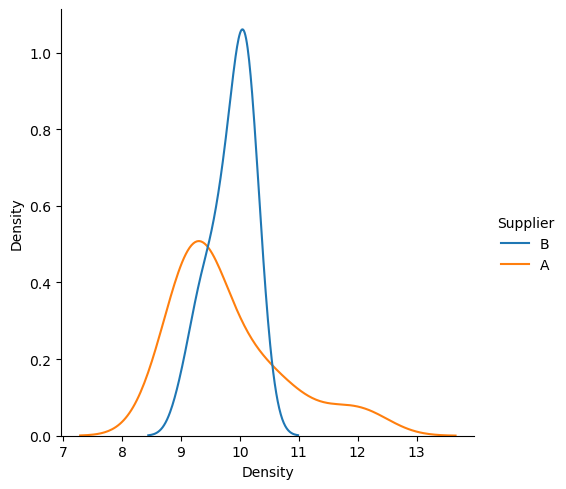

In [240]:
sns.displot(data = batch_df, x='Density', hue='Supplier',
            common_norm=False, kind='kde')

plt.show()

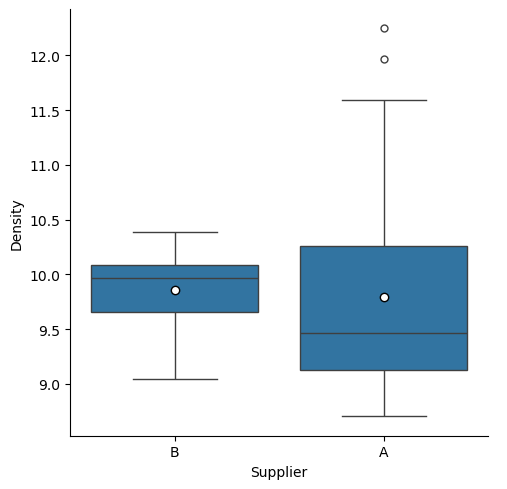

In [241]:
sns.catplot(data = batch_df, x='Supplier', y='Density', kind='box',
            showmeans=True,
            meanprops={'marker': 'o', 'markerfacecolor': 'white', 'markeredgecolor': 'black'})

plt.show()

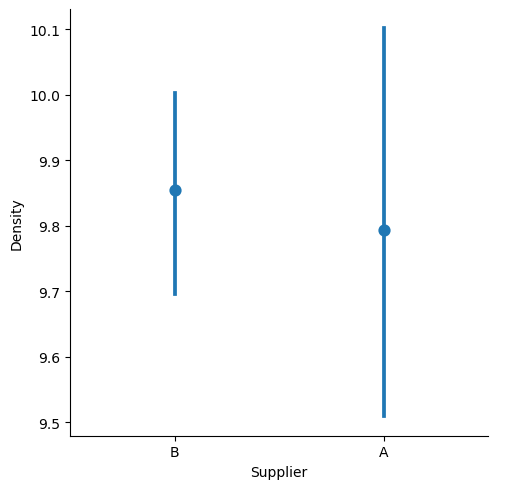

In [244]:
sns.catplot(data = batch_df, x='Supplier', y='Density', kind='point', linestyle='none')

plt.show()

Yes, the SUMMARY STATISTICS of `Density` depends on the `Supplier` and the average `Density` depends on the `Supplier`

In [246]:
batch_df['Batch'] = batch_df.Batch.astype('int64')

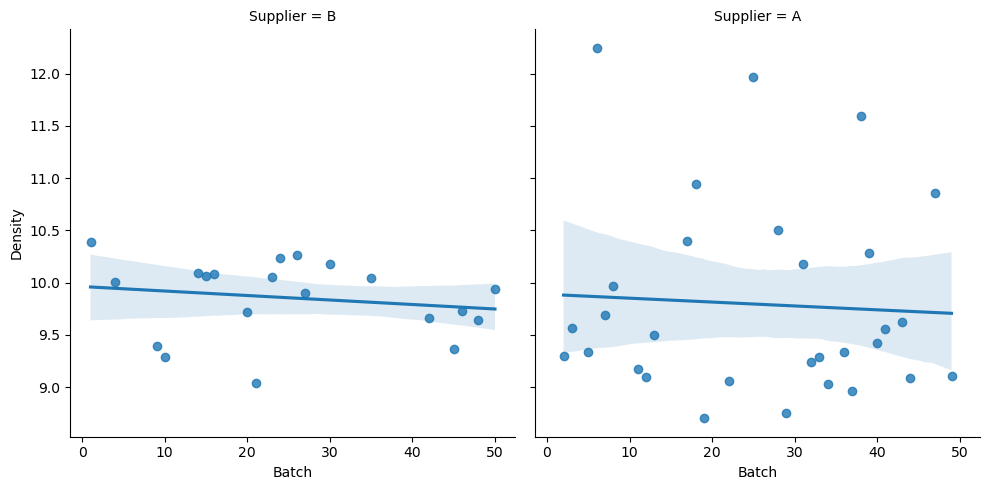

In [249]:
sns.lmplot(data=batch_df, x='Batch', y='Density', col='Supplier')

plt.show()

Since the TREND LINE is not very steep we cannot establish a clear relationship between `Batch` and `Density` across unique values `Supplier`

In [252]:
correlation_by_Supplier = batch_df.groupby('Supplier')[['Batch', 'Density']].corr()

In [259]:
correlation_by_Supplier

Batch   Density
Supplier                            
A        Batch    1.000000 -0.058053
         Density -0.058053  1.000000
B        Batch    1.000000 -0.177093
         Density -0.177093  1.000000

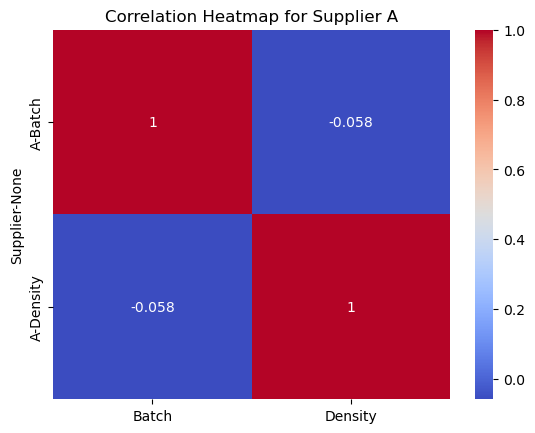

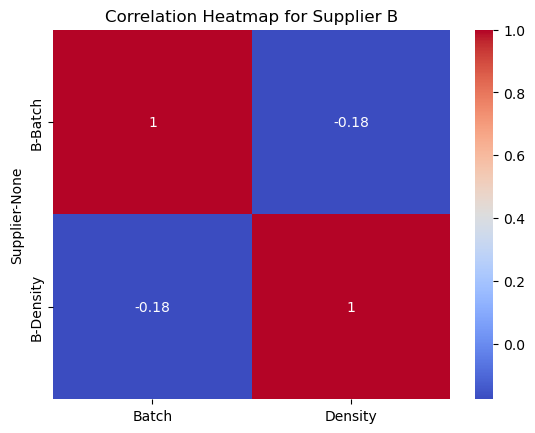

In [258]:
for Supplier, corr_matrix in correlation_by_Supplier.groupby(level=0):
    plt.figure()
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
    plt.title(f'Correlation Heatmap for Supplier {Supplier}')
    plt.show()

negligible correlation

In [239]:
# merge the batch supplier data set with the (concatenated) machine data set

dfa = pd.merge( batch_df, machine_df, on='Batch' )
dfa.head()

,Batch,Supplier,Density,ID,s_id,x1,x2,x3,x4,machine_id
0,1,B,10.388587,B001-M01-S001,1,50.117118,102.167346,22.067812,13.889524,1
1,1,B,10.388587,B001-M01-S002,2,46.887333,112.266102,23.197330,13.064709,1
2,1,B,10.388587,B001-M01-S003,3,50.132744,103.674908,22.319933,13.647482,1
3,1,B,10.388587,B001-M01-S004,4,48.501042,107.143156,22.162947,14.077758,1
4,1,B,10.388587,B001-M01-S005,5,49.690442,102.120283,22.248696,13.728666,1


In [242]:
dfa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14729 entries, 0 to 14728
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Batch       14729 non-null  object 
 1   Supplier    14729 non-null  object 
 2   Density     14729 non-null  float64
 3   ID          14729 non-null  object 
 4   s_id        14729 non-null  object 
 5   x1          14729 non-null  float64
 6   x2          14729 non-null  float64
 7   x3          14729 non-null  float64
 8   x4          14729 non-null  float64
 9   machine_id  14729 non-null  object 
dtypes: float64(5), object(5)
memory usage: 1.1+ MB


In [247]:
dfa.Density.nunique()

50

In [248]:
dfa['Density'] = dfa.Density.astype('object')

In [250]:
dfa_features = dfa.select_dtypes('number').copy()
dfa_objects = dfa.select_dtypes('object').copy()
id_cols = ['rowid'] + dfa_objects.columns.to_list()
dfa_lf = dfa.reset_index().\
rename(columns={'index': 'rowid'}).\
melt(id_vars=id_cols, value_vars=df_features.columns)

dfa_lf. head()

,rowid,Batch,Supplier,Density,ID,s_id,machine_id,variable,value
0,0,1,B,10.388587,B001-M01-S001,1,1,x1,50.117118
1,1,1,B,10.388587,B001-M01-S002,2,1,x1,46.887333
2,2,1,B,10.388587,B001-M01-S003,3,1,x1,50.132744
3,3,1,B,10.388587,B001-M01-S004,4,1,x1,48.501042
4,4,1,B,10.388587,B001-M01-S005,5,1,x1,49.690442


**Explore if the summary statistics of the 4 OPERATING VARIABLES x1 through x4 vary across Batch for each MACHINE given each Supplier. Your figures MUST use Batch as the x-axis variable.**

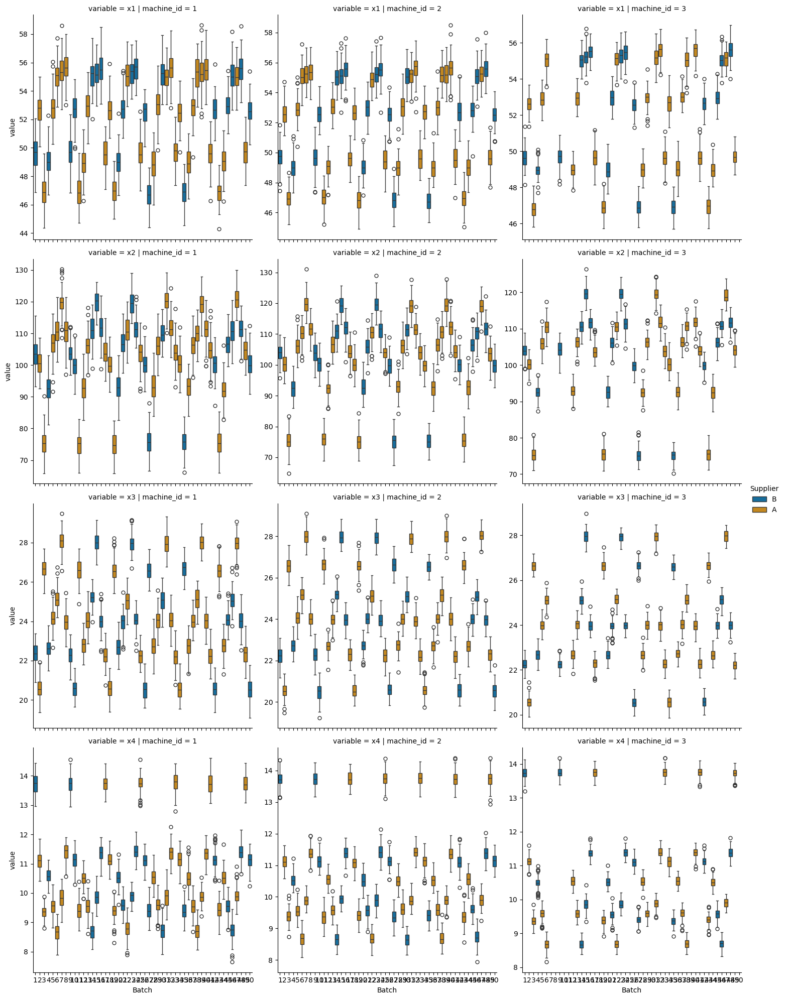

In [266]:
sns.catplot(data = dfa_lf, x='Batch', y='value', col='machine_id',
            row='variable', hue='Supplier',
            kind='box',
            sharey=False)

plt.show()

Given a `Supplier` the summary statistics of OPERATING VARIABLE `x1` through `x4` **vary across** `Batch` for each `MACHINE`

**Explore if the relationships between the 4 OPERATING VARIABLES x1 through x4 vary across Supplier.**

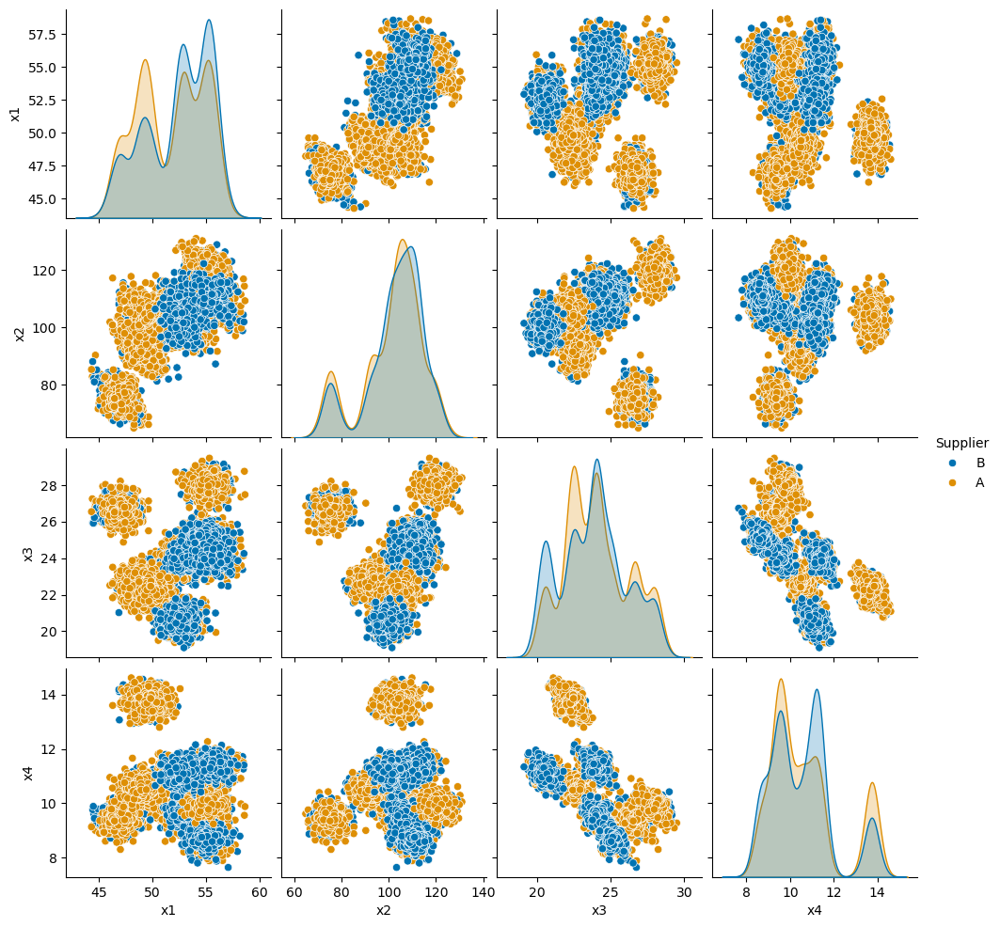

In [272]:
sns.pairplot(data=dfa[['Supplier', 'x1', 'x2', 'x3', 'x4']],
             hue='Supplier',
             diag_kws={'common_norm': False})

plt.show()

Primarily for `Supplier` A - Higher values of `x4` tend to have unique relationships with other three variables

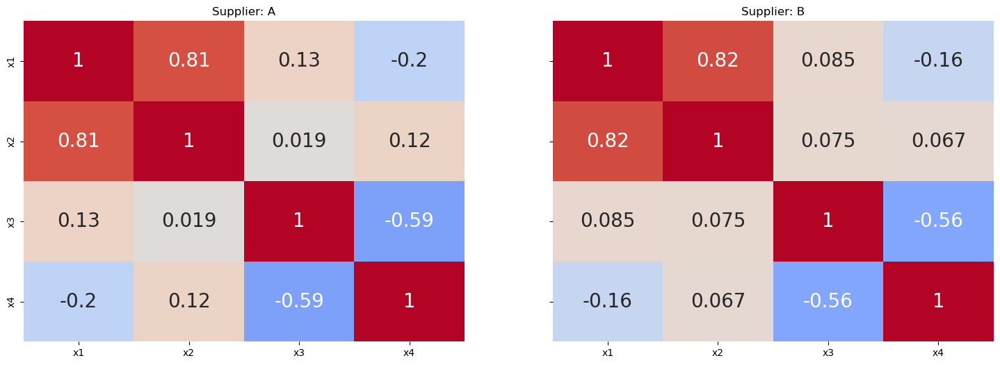

In [286]:
the_groups = dfa.Supplier.unique().tolist()

the_groups.sort()

corr_per_group = dfa.loc[ :, ['Supplier', 'x1', 'x2', 'x3', 'x4']].groupby(['Supplier']).corr()

fig, axs = plt.subplots(1, len(the_groups), figsize=(18, 6), sharex=True, sharey=True )

for ix in range(len(the_groups)):
    sns.heatmap( data = corr_per_group.loc[ the_groups[ ix ] ],
                 vmin=-1, vmax=1, center = 0,
                 cmap='coolwarm', cbar=False,
                 annot=True, annot_kws={'size': 20},
                 ax=axs[ix] )
    
    axs[ ix ].set_title('Supplier: %s' % the_groups[ ix ] )

plt.show()

Following relationship is seen across both `Supplier`s

1. `x1` and `x2` are highly correlated
2. `x3` and `x4` are moderately correlated

## Problem 03

The DROP TEST result data set file name is provided for you below. You must read in the CSV file and assign the dta set to the `test_df` object. 

You must perform the following **ESSENTIAL** activities:

* How many rows and columns are in the data? 
* What are the names and data types for each column?
* How many unique values are there for each column?
* How many missing values are there for each column?

You must visually explore the MARGINAL behavior of the variables in the data. You must use visualizations appropriate for the DATA TYPE of the columns.

You must visually explore RELATIONSHIPS between variables in the data. You must use visualizations appropriate for the DATA TYPES. You must make sure that your visualizations can answer the following questions:
* Count the number of times each unique value of `Result` occurs for each `test_group_id` value.

After exploring the `test_df` DataFrame, you **MUST** JOIN/MERGE the `test_df` DataFrame with the `dfa` DataFrame. Assign the merged DataFrame to the `dfb` DataFrame. You **MUST** answer the following:
* How many rows remain using the DEFAULT joining procedure?

You may add as many markdown and code cells as you see fit to answer this question. 

#### SOLUTION

In [282]:
# define the test data set file name
test_file = 'midterm_test.csv'

In [283]:
# read in the test data set

test_df = pd.read_csv(test_file)

In [284]:
test_df.shape

(1412, 3)

In [285]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   ID             1412 non-null   object
 1   test_group_id  1412 non-null   object
 2   Result         1412 non-null   int64 
dtypes: int64(1), object(2)
memory usage: 33.2+ KB


In [264]:
test_df.nunique()

ID               1412
test_group_id     141
Result              2
dtype: int64

In [265]:
test_df.isna().sum()

ID               0
test_group_id    0
Result           0
dtype: int64

In [286]:
test_df.describe()

,Result
count,1412.000000
mean,0.301700
std,0.459158
min,0.000000
25%,0.000000
50%,0.000000
75%,1.000000
max,1.000000


In [288]:
test_df.describe(include='object')

,ID,test_group_id
count,1412,1412
unique,1412,141
top,B001-M01-S056,L-4
freq,1,14


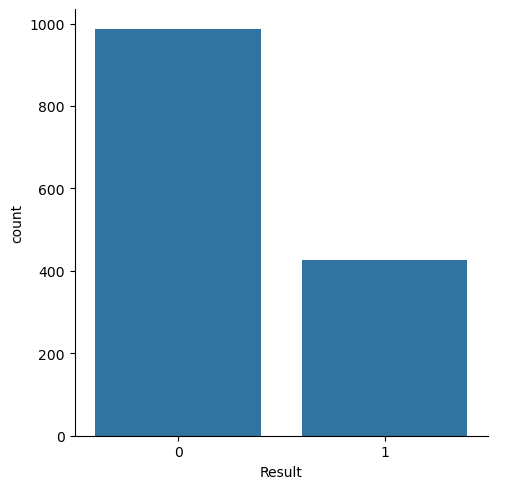

In [289]:
sns.catplot(data=test_df,
            x='Result',
            kind='count')

plt.show()

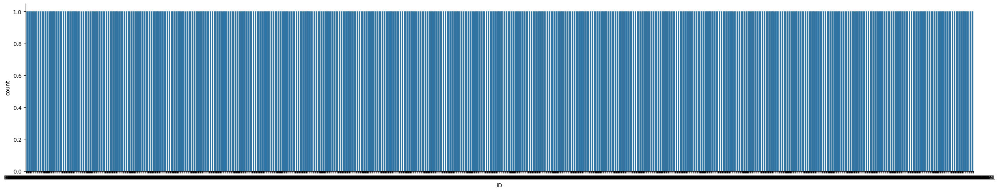

In [290]:
sns.catplot(data=test_df,
            x='ID',
            kind='count',
            aspect=5)

plt.show()

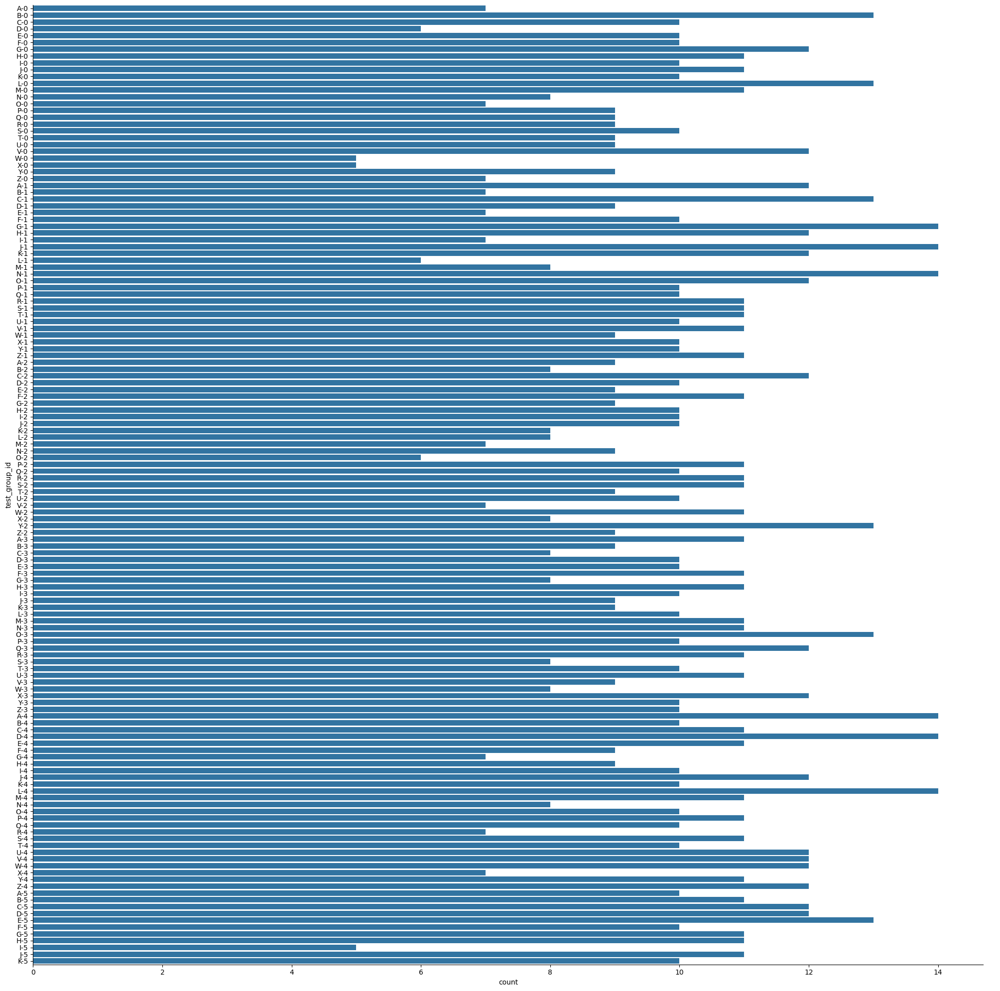

In [273]:
sns.catplot(data=test_df,
            y='test_group_id',
            kind='count',
            height=20)

plt.show()

In [ ]:
# merge test_df with the dfa object

dfb = 

## Problem 04

You must now examine the merged `dfb` object and answer the following:

* Count the number of times each unique value of `Result` occurs for each value of `machine_id`.
* Count the number of times each unique value of `Result` occurs for each value of `Supplier`.
* Visualize the number of times each unique value of `Result` occurs per `Batch` for each value of `machine_id`.
* Visualize the number of times each unique value of `Result` occurs per `Batch` for each value of `machine_id` and `Supplier`.
* Calculate the PROPORTION of times the cell phone case failed the test in each `Batch` per `machine_id`.
* Visualize the PROPORTION of times the cell phone case failed the test in each `Batch` per `machine_id` and for each unique value of `Supplier`.

*HINT*: Remember that a FAILED test is encoded as `Result == 1`. How can you calculate the PROPORTION of times `Result == 1`?

Add as many cells as you see fit to answer this question.

#### SOLUTION

## Problem 05

You must cluster the rows of `dfb` using the 4 operational variables `x1` through `x4`. You must decide how many clusters to use and describe how you made that choice. You may use KMeans OR Hierarchical clustering. Include any figures that helped you make that choice.

Visualize your cluster analysis results by:
* Plotting the number of observations per cluster.
* Visualizing the relationships between the operational variables GIVEN the cluster.

You are interested in the PROPORTION of cell phone cases that failed the DROP TEST. Are any of the clusters associated with higher failure PROPORTIONS than others? Based on your visualizations how would you describe that cluster?

Add as many cells as you see fit to answer this question.

#### SOLUTION